# Machine Learning for Time Series Data in Python

> Time series data is ubiquitous. Whether it be stock market fluctuations, sensor data recording climate change, or activity in the brain, any signal that changes over time can be described as a time series.

- toc: true
- branch: master
- badges: true
- comments: true
- author: Datacamp
- categories: [Python, Data Visualization, EDA, Time Series, Machine Learning, scikit-learn, Regression, classification, Tempogram, Spectrogram, Cross-valiation, Stationarity]
- image: images/timeseries.png
- hide: false
- search_exclude: true
- metadata_key1: metadata_value1
- metadata_key2: metadata_value2


> Machine learning has emerged as a powerful method for leveraging complexity in data in order to generate predictions and insights into the problem one is trying to solve. This course is an intersection between these two worlds of machine learning and time series data, and covers feature engineering, spectograms, and other advanced techniques in order to classify heartbeat sounds and predict stock prices.

PREREQUISITES: Manipulating Time Series Data in Python, Visualizing Time Series Data in Python, Machine Learning with scikit-learn

[**Download Datasets and Presentation slides for this post HERE**](https://github.com/anhhaibkhn/Data-Science-selfstudy-notes-Blog/tree/master/_notebooks/Machine%20Learning%20for%20Time%20Series%20Data%20in%20Python)
<br>


This post is 5th part of Time Series with Python Track from DataCamp. The track includes:
1. [Manipulating Time Series Data in Python](https://anhhaibkhn.github.io/Data-Science-selfstudy-notes-Blog/pandas/data%20visualization/eda/time%20series/stock%20price/scikit-learn/correlation/value-weighte/index/2022/08/25/Manipulating-Time-Series-Data-in-Python.html)
2. [Time Series Analysis in Python](https://anhhaibkhn.github.io/Data-Science-selfstudy-notes-Blog/python/data%20visualization/eda/time%20series/correlation/autocorrelation/arma/cointegration%20model/2022/08/26/Time-Series-Analysis-in-Python.html)
3. [Visualizing Time Series Data in Python](https://anhhaibkhn.github.io/Data-Science-selfstudy-notes-Blog/python/data%20visualization/eda/time%20series/diagnostics/boxplots/histograms/density%20plots/correlation/clustered%20heatmaps/line%20plots/case%20study/2022/08/27/Visualizing-Time-Series-Data-in-Python.html)
4. [ARIMA Models in Python](https://anhhaibkhn.github.io/Data-Science-selfstudy-notes-Blog/seasonal%20data/forecast/arima/time%20series/arma/armax/aic/bic/acf/pacf/sarima/box-jenkins/2022/08/28/ARIMA-Models-in-Python.html)
5. [Machine Learning for Time Series Data in Python](https://anhhaibkhn.github.io/Data-Science-selfstudy-notes-Blog/python/data%20visualization/eda/time%20series/machine%20learning/scikit-learn/regression/classification/tempogram/spectrogram/cross-valiation/stationarity/2022/08/29/Machine-Learning-for-Time-Series-Data-in-Python.html)

In [1]:
import numpy as np
import warnings

import pandas as pd
pd.set_option('display.expand_frame_repr', False)

import matplotlib.pyplot as plt
plt.style.use('seaborn')
import matplotlib as mpl 
mpl.rcParams['figure.dpi'] = 150
mpl.rcParams['figure.figsize'] = (25, 20)
mpl.rcParams['axes.grid'] = True

warnings.filterwarnings("ignore")

## Time Series and Machine Learning Primer

> This chapter is an introduction to the basics of machine learning, time series data, and the intersection between the two.


### Timeseries kinds and applications

> **Identifying a time series**

Which of the following data sets is not considered time series data?


- Test grades for the last fall and spring semesters of high-school students.


- A student's attendance record each week of the semester.


- The school's national annual ranking since 2000.


- **A list of the average length of each class at the school** ---> You don't have timestamps for each data point, so it is not

> **Plotting a time series (I)**

In this exercise, you'll practice plotting the values of two time series without the time component.

Two DataFrames, data and data2 are available in your workspace.


Instructions:<br>

- Plot the values column of both the data sets on top of one another, one per axis object.

In [2]:
data = pd.read_csv('datasets/data.csv', index_col=[0])
data2 = pd.read_csv('datasets/data2.csv', index_col=[0])

display(data.head())
display(data2.head())

,data_values
0,214.009998
1,214.379993
2,210.969995
3,210.580000
4,211.980005


,data_values
0,-0.006970
1,-0.007953
2,-0.008903
3,-0.009798
4,-0.010617


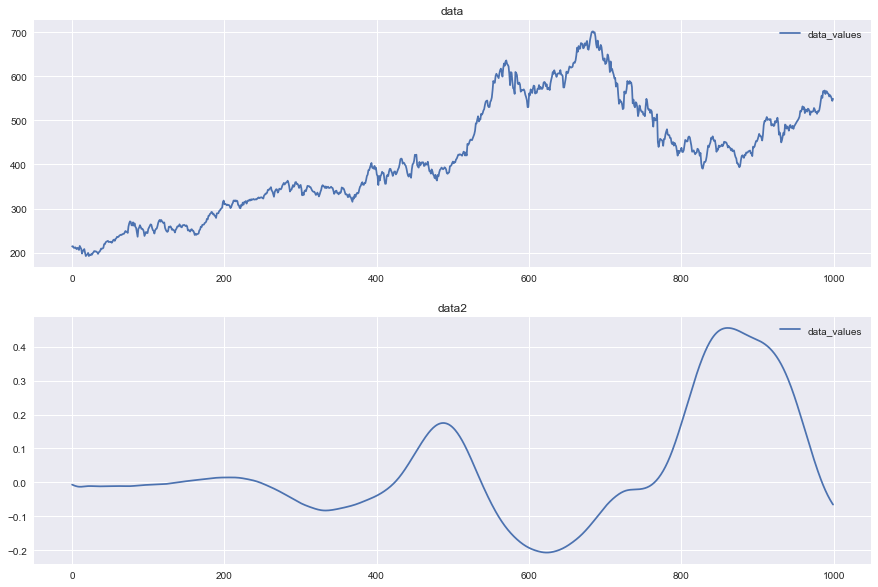

In [3]:
# Plot the time series in each dataset
fig, axs = plt.subplots(2, 1, figsize=(15, 10))
data.iloc[:1000].plot(y='data_values', ax=axs[0], title="data")
data2.iloc[:1000].plot(y='data_values', ax=axs[1], title="data2")
plt.show()

> **Plotting a time series (II)**

You'll now plot both the datasets again, but with the included time stamps for each (stored in the column called "time"). Let's see if this gives you some more context for understanding each time series data.

Instructions:<br>

- Plot data and data2 on top of one another, one per axis object.
- The x-axis should represent the time stamps and the y-axis should represent the


In [4]:
data = pd.read_csv('datasets/data_with_tstamp.csv', index_col=[0])
data2 = pd.read_csv('datasets/data2_with_tstamp.csv', index_col=[0])

display(data.head())
display(data2.head())

,time,data_values
0,2010-01-04,214.009998
1,2010-01-05,214.379993
2,2010-01-06,210.969995
3,2010-01-07,210.580000
4,2010-01-08,211.980005


,data_values,time
0,-0.006970,0.000000
1,-0.007953,0.000045
2,-0.008903,0.000091
3,-0.009798,0.000136
4,-0.010617,0.000181


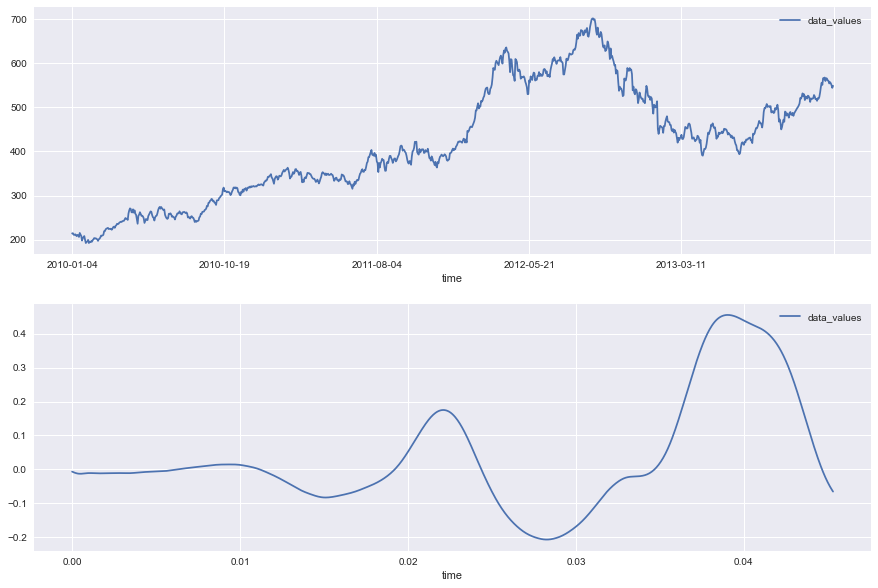

In [5]:
# Plot the time series in each dataset
fig, axs = plt.subplots(2, 1, figsize=(15, 10))
data.iloc[:1000].plot(x='time', y='data_values', ax=axs[0])
data2.iloc[:1000].plot(x='time', y='data_values', ax=axs[1])
plt.show()

### Machine learning basics

> **Fitting a simple model: classification**

In this exercise, you'll use the iris dataset (representing petal characteristics of a number of flowers) to practice using the scikit-learn API to fit a classification model. You can see a sample plot of the data to the right.

Note: This course assumes some familiarity with Machine Learning and scikit-learn. For an introduction to scikit-learn, we recommend the Supervised Learning with Scikit-Learn and Preprocessing for Machine Learning in Python courses.

Instructions:<br>

- Print the first five rows of data.
- Extract the "petal length (cm)" and "petal width (cm)" columns of data and assign it to X.
- Fit a model on X and y.

In [6]:
data = pd.read_csv('datasets/iris.csv', index_col=[0])
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
plt.style.use('default')

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
50,7.0,3.2,4.7,1.4,1
51,6.4,3.2,4.5,1.5,1
52,6.9,3.1,4.9,1.5,1
53,5.5,2.3,4.0,1.3,1
54,6.5,2.8,4.6,1.5,1


data.target.unique:  [1 2]


<AxesSubplot:xlabel='petal length (cm)', ylabel='petal width (cm)'>

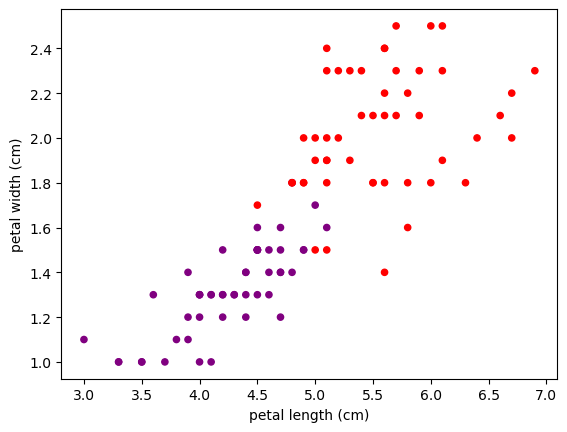

In [7]:
# Print the first 5 rows for inspection
display(data.head())
print("data.target.unique: ",data.target.unique())
colors = np.where(data["target"]==1,'purple','red')
data.plot.scatter(x='petal length (cm)', y='petal width (cm)', c=colors)

In [8]:
from sklearn.svm import LinearSVC
 
# Construct data for the model
X = data[['petal length (cm)','petal width (cm)']]
y = data[['target']]
 
# Fit the model
model = LinearSVC()
model.fit(X, y)


LinearSVC()

> **Predicting using a classification model**

Now that you have fit your classifier, let's use it to predict the type of flower (or class) for some newly-collected flowers.

Information about petal width and length for several new flowers is stored in the variable targets. Using the classifier you fit, you'll predict the type of each flower.

Instructions:<br>

- Predict the flower type using the array X_predict.
- Run the given code to visualize the predictions.

In [9]:
targets = pd.read_csv('datasets/targets.csv', index_col=[0])

[2 2 2 1 1 2 2 2 2 1 2 1 1 2 1 1 2 1 2 2]


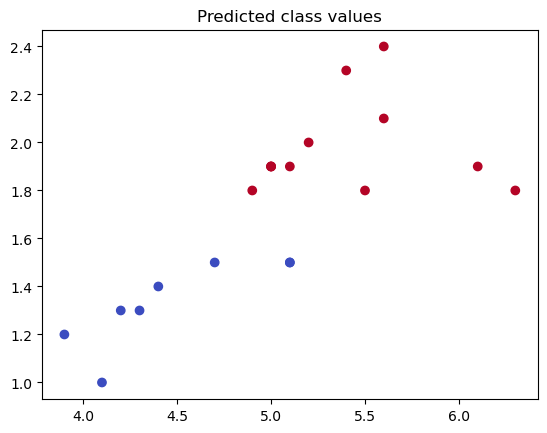

" Note that the output of your predictions are all integers, representing that datapoint's predicted class."

In [10]:
# Create input array
X_predict = targets[['petal length (cm)', 'petal width (cm)']]
 
# Predict with the model
predictions = model.predict(X_predict)
print(predictions)
# [2 2 2 1 1 2 2 2 2 1 2 1 1 2 1 1 2 1 2 2]
 
# Visualize predictions and actual values
plt.scatter(X_predict['petal length (cm)'], X_predict['petal width (cm)'],
            c=predictions, cmap=plt.cm.coolwarm)
plt.title("Predicted class values")
plt.show()

""" Note that the output of your predictions are all integers, representing that datapoint's predicted class."""

> **Fitting a simple model: regression**


In this exercise, you'll practice fitting a regression model using data from the California housing market. A DataFrame called **housing** is available in your workspace. It contains many variables of data (stored as columns). Can you find a relationship between the following two variables?

- **"MedHouseVal"**: the median house value for California districts (in $100,000s of dollars)
- **"AveRooms"** : average number of rooms per dwelling

Instructions: <br>

- Prepare X and y DataFrames using the data in housing.
- X should be the Median House Value, y average number of rooms per dwelling.
- Fit a regression model that uses these variables (remember to shape the variables correctly!).
- Don't forget that each variable must be the correct shape for scikit-learn to use it!

In [11]:
housing = pd.read_csv("datasets/housing.csv", index_col=[0])
display(housing.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3989 entries, 0 to 3988
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   MedInc       3989 non-null   float64
 1   HouseAge     3989 non-null   float64
 2   AveRooms     3988 non-null   float64
 3   AveBedrms    3988 non-null   float64
 4   Population   3988 non-null   float64
 5   AveOccup     3988 non-null   float64
 6   Latitude     3988 non-null   float64
 7   Longitude    3988 non-null   float64
 8   MedHouseVal  3988 non-null   float64
dtypes: float64(9)
memory usage: 311.6 KB


None

<AxesSubplot:xlabel='MedHouseVal', ylabel='AveRooms'>

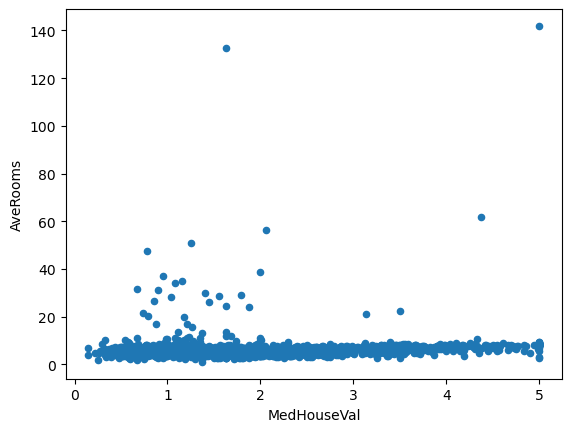

In [12]:
housing.plot.scatter(y='AveRooms', x='MedHouseVal')

In [13]:
housing[housing.isna().any(axis=1)]

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
3988,4.925,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
housing.dropna(inplace=True)

In [15]:
from sklearn import linear_model
 
# Prepare input and output DataFrames
X = housing[['MedHouseVal']]
y = housing[['AveRooms']]
 
# Fit the model
model = linear_model.LinearRegression()
model.fit(X,y)

"""In regression, the output of your model is a continuous array of numbers, not class identity."""


'In regression, the output of your model is a continuous array of numbers, not class identity.'

> **Predicting using a regression model**

Now that you've fit a model with the California housing data, lets see what predictions it generates on some new data. You can investigate the underlying relationship that the model has found between inputs and outputs by feeding in a range of numbers as inputs and seeing what the model predicts for each input.

A 1-D array new_inputs consisting of 100 "new" values for "MedHouseVal" (median house value) is available in your workspace along with the model you fit in the previous exercise.

Instructions:<br>

- Review new_inputs in the shell.
- Reshape new_inputs appropriately to generate predictions.
- Run the given code to visualize the predictions.

In [16]:
new_inputs_df = pd.read_csv('./datasets/newinputs.csv', index_col=[0])
new_inputs = new_inputs_df.to_numpy()
new_inputs.reshape((100,))

array([0.14999   , 0.1989801 , 0.2479702 , 0.2969603 , 0.3459504 ,
       0.39494051, 0.44393061, 0.49292071, 0.54191081, 0.59090091,
       0.63989101, 0.68888111, 0.73787121, 0.78686131, 0.83585141,
       0.88484152, 0.93383162, 0.98282172, 1.03181182, 1.08080192,
       1.12979202, 1.17878212, 1.22777222, 1.27676232, 1.32575242,
       1.37474253, 1.42373263, 1.47272273, 1.52171283, 1.57070293,
       1.61969303, 1.66868313, 1.71767323, 1.76666333, 1.81565343,
       1.86464354, 1.91363364, 1.96262374, 2.01161384, 2.06060394,
       2.10959404, 2.15858414, 2.20757424, 2.25656434, 2.30555444,
       2.35454455, 2.40353465, 2.45252475, 2.50151485, 2.55050495,
       2.59949505, 2.64848515, 2.69747525, 2.74646535, 2.79545545,
       2.84444556, 2.89343566, 2.94242576, 2.99141586, 3.04040596,
       3.08939606, 3.13838616, 3.18737626, 3.23636636, 3.28535646,
       3.33434657, 3.38333667, 3.43232677, 3.48131687, 3.53030697,
       3.57929707, 3.62828717, 3.67727727, 3.72626737, 3.77525

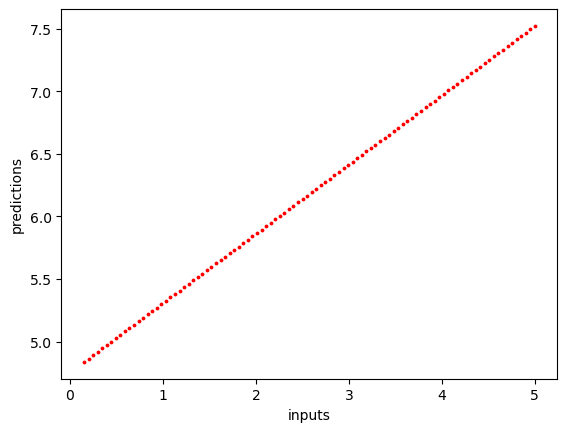

' Here the red line shows the relationship that your model found. As the number of rooms grows, the median house value rises linearly.'

In [17]:
# Generate predictions with the model using those inputs
predictions = model.predict(new_inputs.reshape(-1,1))
 
# Visualize the inputs and predicted values
plt.scatter(new_inputs, predictions, color='r', s=3)
plt.xlabel('inputs')
plt.ylabel('predictions')
plt.show()

""" Here the red line shows the relationship that your model found. As the number of rooms grows, the median house value rises linearly."""

### Machine learning and time series data

> **Inspecting the classification data**

In these final exercises of this chapter, you'll explore the two datasets you'll use in this course.

The first is a collection of heartbeat sounds. Hearts normally have a predictable sound pattern as they beat, but some disorders can cause the heart to beat abnormally. This dataset contains a training set with labels for each type of heartbeat, and a testing set with no labels. You'll use the testing set to validate your models.

As you have labeled data, this dataset is ideal for classification. In fact, it was originally offered as a part of a [public Kaggle competition](https://www.kaggle.com/kinguistics/heartbeat-sounds).

Instructions:<br>

- Use glob to return a list of the .wav files in data_dir directory.
- Import the first audio file in the list using librosa.
- Generate a time array for the data.
- Plot the waveform for this file, along with the time array.


```python

import librosa as lr
from glob import glob
data_dir = './files'

 
# List all the wav files in the folder
audio_files = glob(data_dir + '/*.wav')
print(len(audio_files))
 
# Read in the first audio file, create the time array
audio, sfreq = lr.load(audio_files[0])
time = np.arange(0, len(audio)) / sfreq
 
# Plot audio over time
fig, ax = plt.subplots()
ax.plot(time, audio)
ax.set(xlabel='Time (s)', ylabel='Sound Amplitude')
plt.show()

```

Output:

![](./images/audio_over_time.svg)

> **Inspecting the regression data**

The next dataset contains information about company market value over several years of time. This is one of the most popular kind of time series data used for regression. If you can model the value of a company as it changes over time, you can make predictions about where that company will be in the future. This dataset was also originally provided as part of a public Kaggle competition.

In this exercise, you'll plot the time series for a number of companies to get an understanding of how they are (or aren't) related to one another.

Instructions:<br>

- Import the data with Pandas (stored in the file 'prices.csv').
- Convert the index of data to datetime.
- Loop through each column of data and plot the the column's values over time.

In [18]:
mpl.rcParams['figure.figsize'] = (15, 10)

                  AAPL  FB       NFLX          V        XOM
time                                                       
2010-01-04  214.009998 NaN  53.479999  88.139999  69.150002
2010-01-05  214.379993 NaN  51.510001  87.129997  69.419998
2010-01-06  210.969995 NaN  53.319999  85.959999  70.019997
2010-01-07  210.580000 NaN  52.400001  86.760002  69.800003
2010-01-08  211.980005 NaN  53.300002  87.000000  69.519997


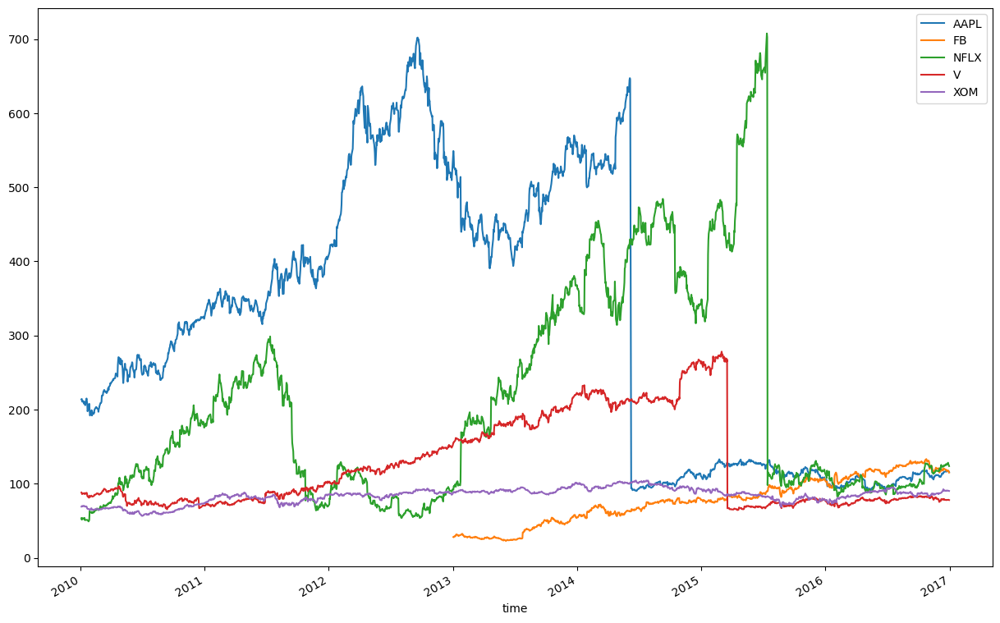

" Note that each company's value is sometimes correlated with others, and sometimes not. Also note there are a lot of 'jumps' in there - what effect do you think these jumps would have on a predictive model? "

In [19]:
# Read in the data
data = pd.read_csv('./datasets/prices_new.csv', index_col=0)
 
# Convert the index of the DataFrame to datetime
data.index = pd.to_datetime(data.index)
print(data.head())
 
# Loop through each column, plot its values over time
fig, ax = plt.subplots()
for column in data.columns:
    data[column].plot(ax=ax, label=column)
ax.legend()
plt.show()

""" Note that each company's value is sometimes correlated with others, and sometimes not. Also note there are a lot of 'jumps' in there - what effect do you think these jumps would have on a predictive model? """


## Time Series as Inputs to a Model
> The easiest way to incorporate time series into your machine learning pipeline is to use them as features in a model. This chapter covers common features that are extracted from time series in order to do machine learning.


### Classifying a time series

Some preprocessing steps to load the data for next sections.

In [2]:
import csv
import os
import re 

def convert_txt_to_csv(file_path):
    new_file_name = os.path.splitext(file_path)[0] + '.csv'

    with open(file_path, "r") as f:
        plain_str = f.read()
        print(plain_str[:10], plain_str[-10:])
        csv_data = re.match(r".*?b\'(.*)\'.*?", plain_str).group(1) # remove byte traces
        print(csv_data[:10], csv_data[-10:])
        csv_data = csv_data.replace('\\n', '\n') # remove \\n with actual new line chars

        with open(new_file_name, 'w') as out:
            out.write(csv_data)


files_to_convert = [    
                        './datasets/abnormal.txt',
                        './datasets/normal.txt'
                    ]
for file_path in files_to_convert:
    convert_txt_to_csv(file_path)

    

b'time,0,1 062869\n'

time,0,1,2 09062869\n
b'time,3,4 4424245\n'
time,3,4,6 44424245\n


In [113]:
# Read in the data
abnormal_df = pd.read_csv('./datasets/abnormal.csv', index_col=[0])
display(abnormal_df.tail())
print(abnormal_df.info())

# Read in the data
normal_df = pd.read_csv('./datasets/normal.csv', index_col=[0])
display(normal_df.tail())
print(normal_df.info())

,0,1,2
time,,,
3.997732,0.010513,-0.401539,0.138510
3.998186,0.009675,-0.360107,0.134382
3.998639,0.007957,-0.317170,0.124178
3.999093,0.006445,-0.275164,0.109530
3.999546,0.006529,-0.233864,0.090629


<class 'pandas.core.frame.DataFrame'>
Float64Index: 8820 entries, 0.0 to 3.999546485260771
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       8820 non-null   float64
 1   1       8820 non-null   float64
 2   2       8820 non-null   float64
dtypes: float64(3)
memory usage: 275.6 KB
None


,3,4,6
time,,,
3.997732,-0.000089,-0.005931,0.002474
3.998186,-0.000112,-0.004839,0.004467
3.998639,-0.000233,-0.000591,0.016809
3.999093,-0.000103,-0.001320,0.008762
3.999546,-0.000367,0.000652,0.004442


<class 'pandas.core.frame.DataFrame'>
Float64Index: 8820 entries, 0.0 to 3.999546485260771
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   3       8820 non-null   float64
 1   4       8820 non-null   float64
 2   6       8820 non-null   float64
dtypes: float64(3)
memory usage: 275.6 KB
None


In [132]:
normal = normal_df.to_numpy()
print(normal.shape)

abnormal = abnormal_df.to_numpy()
print(abnormal.shape)

sfreq = 2205

# import inspect
# source = inspect.getsource(show_plot_and_make_titles)
# print(source)

def show_plot_and_make_titles():
   axs[0, 0].set(title="Normal Heartbeats")
   axs[0, 1].set(title="Abnormal Heartbeats")
   plt.tight_layout()
   plt.show()

(8820, 3)
(8820, 3)


> **Many repetitions of sounds**

In this exercise, you'll start with perhaps the simplest classification technique: averaging across dimensions of a dataset and visually inspecting the result.

You'll use the heartbeat data described in the last chapter. Some recordings are normal heartbeat activity, while others are abnormal activity. Let's see if you can spot the difference.

Two DataFrames, `normal` and `abnormal`, each with the shape of (`n_times_points`, `n_audio_files`) containing the audio for several heartbeats are available in your workspace. Also, the sampling frequency is loaded into a variable called sfreq. A convenience plotting function show_plot_and_make_titles() is also available in your workspace.

Instructions:<br>

- First, create the time array for these audio files (all audios are the same length).
- Then, stack the values of the two DataFrames together (`normal` and `abnormal`, in that order) so that you have a single array of shape (`n_audio_files`, `n_times_points`).
- Finally, use the code provided to loop through each list item / axis, and plot the audio over time in the corresponding axis object.
- You'll plot normal heartbeats in the left column, and abnormal ones in the right column

In [166]:
import matplotlib as mpl 
mpl.rcParams['figure.dpi'] = 200
mpl.rcParams['figure.figsize'] = (30, 15)

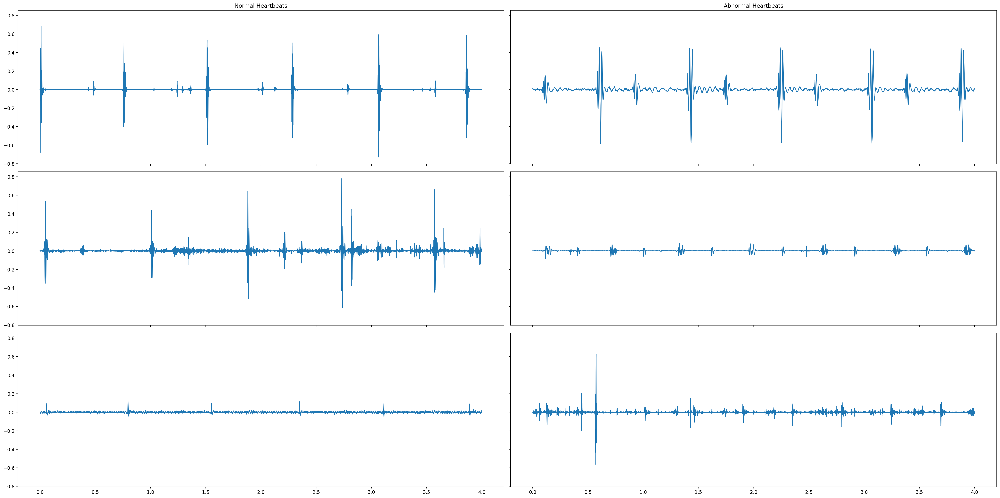

" As you can see there is a lot of variability in the raw data, let's see if you can average out some of that noise to notice a difference."

In [167]:
fig, axs = plt.subplots(3, 2, figsize=(30, 15), sharex=True, sharey=True)

# Calculate the time array
time = np.arange(normal.shape[0]) / sfreq

# Stack the normal/abnormal audio so you can loop and plot
stacked_audio = np.hstack([normal, abnormal]).T

# Loop through each audio file / ax object and plot
# .T.ravel() transposes the array, then unravels it into a 1-D vector for looping
for iaudio, ax in zip(stacked_audio, axs.T.ravel()):
    ax.plot(time, iaudio)

show_plot_and_make_titles()

""" As you can see there is a lot of variability in the raw data, let's see if you can average out some of that noise to notice a difference."""


> **Invariance in time**

While you should always start by visualizing your raw data, this is often uninformative when it comes to discriminating between two classes of data points. Data is usually noisy or exhibits complex patterns that aren't discoverable by the naked eye.

Another common technique to find simple differences between two sets of data is to average across multiple instances of the same class. This may remove noise and reveal underlying patterns (or, it may not).

In this exercise, you'll average across many instances of each class of heartbeat sound.

The two DataFrames (normal and abnormal) and the time array (time) from the previous exercise are available in your workspace.

Instructions:<br>

- Average across the audio files contained in normal and abnormal, leaving the time dimension.
- Visualize these averages over time.

In [168]:
files_to_convert = [    
                        './datasets/invariance_abnormal.txt',
                        './datasets/invariance_normal.txt'
                    ]
for file_path in files_to_convert:
    convert_txt_to_csv(file_path)


b'time,0,1 657\n' 



time,0,1,2 27398657\n
b'time,3,4 68237\n' 

time,3,4,6 05768237\n


In [169]:
normal   = pd.read_csv('./datasets/invariance_normal.csv', index_col=[0])   
abnormal = pd.read_csv('./datasets/invariance_abnormal.csv', index_col=[0])   

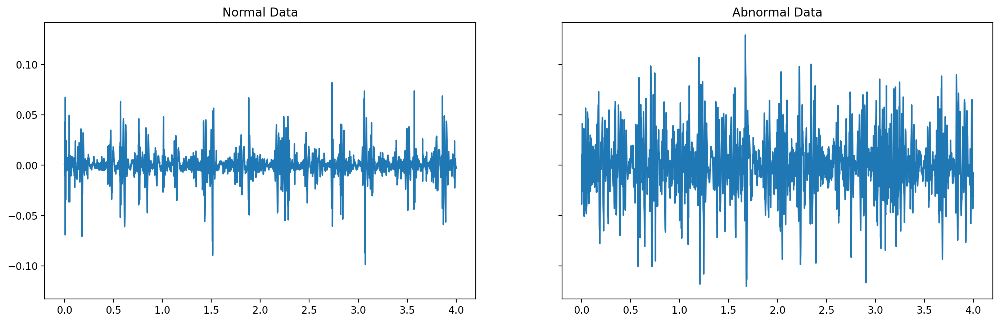

"Do you see a noticeable difference between the two? Maybe, but it's quite noisy. Let's see how you can dig into the data a bit further."

In [170]:
# Average across the audio files of each DataFrame
mean_normal = np.mean(normal, axis=1)
mean_abnormal = np.mean(abnormal, axis=1)
 
# Plot each average over time
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(17, 5), sharey=True)
ax1.plot(time, mean_normal)
ax1.set(title="Normal Data")
ax2.plot(time, mean_abnormal)
ax2.set(title="Abnormal Data")

plt.show()
"""Do you see a noticeable difference between the two? Maybe, but it's quite noisy. Let's see how you can dig into the data a bit further."""

> **Build a classification model**

While eye-balling differences is a useful way to gain an intuition for the data, let's see if you can operationalize things with a model. In this exercise, you will use each repetition as a datapoint, and each moment in time as a feature to fit a classifier that attempts to predict abnormal vs. normal heartbeats using only the raw data.

We've split the two DataFrames (normal and abnormal) into X_train, X_test, y_train, and y_test.

Instructions:<br>

- Create an instance of the Linear SVC model and fit the model using the training data.
- Use the testing data to generate predictions with the model.
- Score the model using the provided code.


In [3]:
files_to_convert = [    './datasets/abnormal_full.txt',
                        './datasets/normal_full.txt'    ]
for file_path in files_to_convert:
    convert_txt_to_csv(file_path)


normal   = pd.read_csv('./datasets/normal_full.csv', index_col=0).select_dtypes(np.float64).astype(np.float32)
abnormal = pd.read_csv('./datasets/abnormal_full.csv', index_col=0).select_dtypes(np.float64).astype(np.float32)

display(normal.head())
display(abnormal.head())
print(normal.shape)
print(abnormal.shape)

b'time,0,1 6235\n' 


time,0,1,2 54446235\n
b'time,3,4 7695\n' 


time,3,4,6 01697695\n


,3,4,6,7,10,12,15,16,17,18,...,34,38,39,40,43,48,49,51,52,55
time,,,,,,,,,,,,,,,,,,,,,
0.000000,-0.000995,0.000281,0.002953,0.005497,0.000433,0.001316,-0.001694,0.000211,0.000042,0.001092,...,0.023688,0.000369,0.000026,0.002742,0.000618,-0.007847,-0.003252,0.008799,-0.361737,-0.001609
0.000454,-0.003381,0.000381,0.003034,0.010088,0.000554,-0.000154,-0.002157,-0.001945,-0.000146,-0.005554,...,0.046644,0.000980,-0.000063,0.002161,0.000476,-0.018061,0.007291,0.017107,-0.651842,-0.004319
0.000907,-0.000948,0.000063,0.000292,0.008272,0.000232,-0.001945,0.000619,0.006148,0.000048,-0.001297,...,0.039666,0.000765,-0.000043,0.001553,-0.000024,-0.017164,0.016447,0.015018,-0.365683,0.000573
0.001361,-0.000766,0.000026,-0.005916,0.009358,0.000538,-0.001429,0.002182,-0.000340,0.001091,-0.002012,...,0.046120,0.000638,-0.000009,0.004452,0.000007,-0.015996,0.018959,0.017465,-0.173468,-0.001807
0.001814,0.000469,-0.000432,-0.005307,0.009418,0.001081,-0.002623,0.004176,-0.003359,-0.000170,0.001939,...,0.041412,0.000054,-0.000215,-0.002014,-0.000658,-0.010558,0.020568,0.018050,0.141141,-0.007140


,0,1,2,5,8,9,11,13,14,19,...,45,46,47,50,53,54,56,57,58,59
time,,,,,,,,,,,,,,,,,,,,,
0.000000,-0.024684,-0.024507,0.008254,-0.030747,-0.000950,0.013836,0.000441,-0.006831,-0.118929,-0.000390,...,0.011269,-0.131191,-0.079911,0.073388,-0.000501,0.025458,-0.005471,-0.003371,-0.003332,-0.005799
0.000454,-0.060429,-0.047736,0.014809,-0.060250,-0.003243,0.036587,0.002488,-0.013365,-0.255299,-0.000819,...,0.021004,-0.260868,-0.162169,0.150714,-0.004710,0.053362,-0.011112,-0.004309,-0.007769,-0.010838
0.000907,-0.070080,-0.039938,0.010475,-0.047856,-0.004097,0.044119,0.000105,-0.011221,-0.186055,-0.001218,...,0.017402,-0.224483,-0.143243,0.129426,-0.007257,0.050708,-0.009940,-0.001084,-0.008644,-0.007528
0.001361,-0.084212,-0.041199,0.010272,-0.048017,-0.004431,0.053670,0.001550,-0.011952,-0.097866,-0.001315,...,0.019285,-0.238368,-0.153451,0.137134,-0.005510,0.052555,-0.011539,-0.000613,-0.010337,-0.008523
0.001814,-0.085111,-0.036050,0.008580,-0.040114,-0.003582,0.060088,0.001222,-0.011607,0.038730,-0.002458,...,0.017182,-0.215284,-0.142139,0.125747,-0.000892,0.046691,-0.012783,0.000383,-0.011342,-0.008434


(8820, 29)
(8820, 31)


In [4]:
stacked_audio = np.hstack([normal, abnormal]).T
X = stacked_audio
X.shape


(60, 8820)

In [5]:

y = np.concatenate((np.full((len(normal.T), 1), 'normal'), np.full((len(abnormal.T), 1), 'abnormal')))
y.shape

(60, 1)

In [6]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

print(type(X), X[:2],X.shape)
print(type(y),y[:2], y.shape)

<class 'numpy.ndarray'> [[-9.9521899e-04 -3.3807522e-03 -9.4784319e-04 ... -2.3299057e-04
  -1.0334120e-04 -3.6749945e-04]
 [ 2.8075944e-04  3.8078491e-04  6.2566738e-05 ... -5.9091963e-04
  -1.3196187e-03  6.5185985e-04]] (60, 8820)
<class 'numpy.ndarray'> [['normal']
 ['normal']] (60, 1)


In [7]:
len(y_test)

18

In [8]:
from sklearn.svm import LinearSVC

# Initialize and fit the model
model = LinearSVC()
model.fit(X_train,y_train)
 
# Generate predictions and score them manually
predictions = model.predict(X_test)
print(sum(predictions == y_test.squeeze()) / len(y_test))


"""Note that your predictions didn't do so well. That's because the features you're using as inputs to the model (raw data) aren't very good at differentiating classes. Next, you'll explore how to calculate some more complex features that may improve the results."""

0.6111111111111112


"Note that your predictions didn't do so well. That's because the features you're using as inputs to the model (raw data) aren't very good at differentiating classes. Next, you'll explore how to calculate some more complex features that may improve the results."

### Improving features for classification

> **Calculating the envelope of sound**

One of the ways you can improve the features available to your model is to remove some of the noise present in the data. In audio data, a common way to do this is to smooth the data and then rectify it so that the total amount of sound energy over time is more distinguishable. You'll do this in the current exercise.

A heartbeat file is available in the variable audio.

Instructions: <br>

- Visualize the raw audio you'll use to calculate the envelope.


In [10]:
import h5py

path = './datasets/audio_munged.hdf5'
f = h5py.File(path,'r')
list(f.keys())     


['h5io']

In [11]:
f['h5io'].keys()

<KeysViewHDF5 ['key_data', 'key_meta', 'key_sfreq']>

In [12]:
sfreq = f['h5io']['key_sfreq'][0] # 2205

In [12]:
key_data = pd.read_hdf(path, key='h5io/key_data')
audio = key_data.squeeze()
display(audio.shape)

(8820, 60)

In [17]:
key_meta = pd.read_hdf(path, key='h5io/key_meta')
display(key_meta.head())
display(key_meta.info())
labels = key_meta["label"].to_numpy() 
labels

,dataset,fname,label,sublabel,set,length
0,a,murmur__201108222226.wav,murmur,NaN,train,7.935601
1,a,murmur__201108222246.wav,murmur,NaN,train,7.935601
2,a,murmur__201108222258.wav,murmur,NaN,train,7.935601
3,a,normal__201103170121.wav,normal,NaN,train,8.030839
4,a,normal__201103140822.wav,normal,NaN,train,8.014059


<class 'pandas.core.frame.DataFrame'>
Int64Index: 60 entries, 0 to 59
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   dataset   60 non-null     object 
 1   fname     60 non-null     object 
 2   label     60 non-null     object 
 3   sublabel  0 non-null      float64
 4   set       60 non-null     object 
 5   length    60 non-null     float64
dtypes: float64(2), object(4)
memory usage: 3.3+ KB


None

array(['murmur', 'murmur', 'murmur', 'normal', 'normal', 'murmur',
       'normal', 'normal', 'murmur', 'murmur', 'normal', 'murmur',
       'normal', 'murmur', 'murmur', 'normal', 'normal', 'normal',
       'normal', 'murmur', 'normal', 'normal', 'murmur', 'murmur',
       'normal', 'normal', 'normal', 'normal', 'murmur', 'murmur',
       'murmur', 'normal', 'normal', 'normal', 'normal', 'murmur',
       'murmur', 'murmur', 'normal', 'normal', 'normal', 'murmur',
       'murmur', 'normal', 'murmur', 'murmur', 'murmur', 'murmur',
       'normal', 'normal', 'murmur', 'normal', 'normal', 'murmur',
       'murmur', 'normal', 'murmur', 'murmur', 'murmur', 'murmur'],
      dtype=object)

Opps! The dataset that Datacamp provided could not be loaded like the one in their exercise. 
Let's load it manually.

In [49]:
audio = pd.read_csv('./datasets/audio.csv', index_col=0)

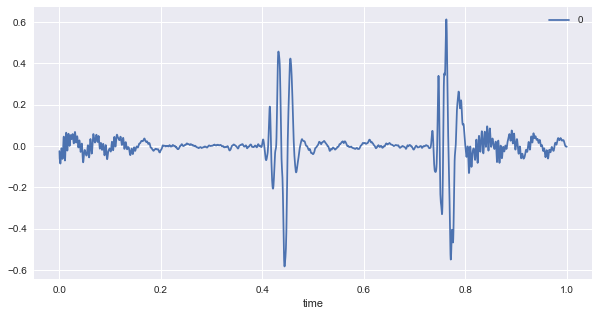

In [53]:
# Plot the raw data first
audio.plot(figsize=(10, 5))
plt.show()

- Rectify the audio.
- Plot the result.

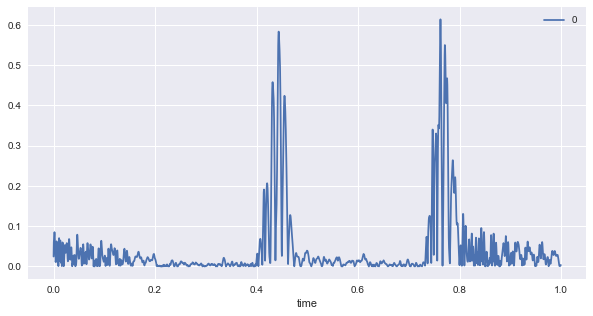

In [56]:
# Rectify the audio signal
audio_rectified = audio.apply(np.abs)

# Plot the result
audio_rectified.plot(figsize=(10, 5))
plt.show()

- Smooth the audio file by applying a rolling mean.
- Plot the result.

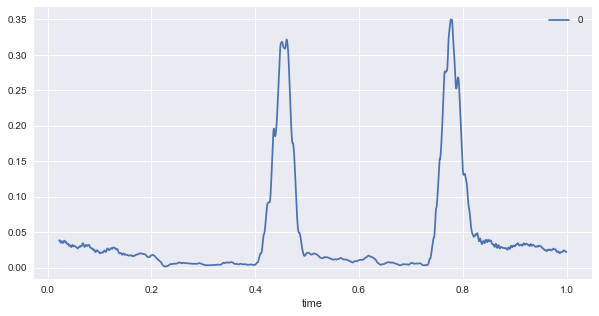

In [57]:
# Smooth by applying a rolling mean
audio_rectified_smooth = audio_rectified.rolling(50).mean()

# Plot the result
audio_rectified_smooth.plot(figsize=(10, 5))
plt.show()

By calculating the envelope of each sound and smoothing it, you've eliminated much of the noise and have a cleaner signal to tell you when a heartbeat is happening.

> **Calculating features from the envelope**

Now that you've removed some of the noisier fluctuations in the audio, let's see if this improves your ability to classify.

`audio_rectified_smooth` from the previous exercise is available in your workspace.

Instructions: <br>

- Calculate the mean, standard deviation, and maximum value for each heartbeat sound.
- Column stack these stats in the same order.
- Use cross-validation to fit a model on each CV iteration.

In [4]:
# prepare data for the exercise
path = './datasets/audio_munged.hdf5'
df = pd.read_hdf(path, key='h5io/key_data')
audio = df.squeeze()
# Smooth by applying a rolling mean
audio_rectified = audio.apply(np.abs)
audio_rectified_smooth = audio_rectified.rolling(50).mean()
audio_rectified_smooth

,0,1,2,3,4,5,6,7,8,9,...,50,51,52,53,54,55,56,57,58,59
time,,,,,,,,,,,,,,,,,,,,,
0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0.000454,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0.000907,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0.001361,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0.001814,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3.997732,0.004950,0.346406,0.058549,0.000319,0.052274,0.022528,0.004678,0.009189,0.005235,0.017860,...,0.038664,0.020346,0.021820,0.016904,0.022293,0.040190,0.013043,0.001105,0.017127,0.016632
3.998186,0.004578,0.347291,0.060633,0.000316,0.052350,0.022081,0.004708,0.009258,0.005331,0.018351,...,0.037305,0.019737,0.022072,0.017210,0.021217,0.039393,0.012920,0.001104,0.017448,0.016551
3.998639,0.004237,0.347701,0.062873,0.000319,0.052310,0.021707,0.005010,0.009341,0.005451,0.019325,...,0.035876,0.019177,0.022175,0.017372,0.020081,0.038636,0.012806,0.001108,0.017796,0.016419


In [62]:
model = LinearSVC()

In [63]:
# Calculate stats
means = np.mean(audio_rectified_smooth, axis=0)
stds = np.std(audio_rectified_smooth, axis=0)
maxs = np.max(audio_rectified_smooth, axis=0)
 
# Create the X and y arrays
X = np.column_stack([means, stds, maxs])
y = labels.reshape([-1, 1])
 
# Fit the model and score on testing data
from sklearn.model_selection import cross_val_score
percent_score = cross_val_score(model, X, y, cv=5)
print(np.mean(percent_score))

0.7166666666666667


This model is both simpler (only 3 features) and more understandable (features are simple summary statistics of the data).

> **Derivative features: The tempogram**

One benefit of cleaning up your data is that it lets you compute more sophisticated features. For example, the envelope calculation you performed is a common technique in computing tempo and rhythm features. In this exercise, you'll use `librosa` to compute some tempo and rhythm features for heartbeat data, and fit a model once more.

Note that `librosa` functions tend to only operate on numpy arrays instead of DataFrames, so we'll access our Pandas data as a Numpy array with the `.values` attribute.

Instructions: <br>

- Use `librosa` to calculate a tempogram of each heartbeat audio.
- Calculate the mean, standard deviation, and maximum of each tempogram (this time using DataFrame methods)
- Column stack these tempo features (mean, standard deviation, and maximum) in the same order.
- Score the classifier with cross-validation.

In [64]:
model = LinearSVC()

In [65]:
import librosa as lr

# Calculate the tempo of the sounds
tempos = []
for col, i_audio in audio.items():
    tempos.append(lr.beat.tempo(i_audio.values, sr=sfreq, hop_length=2**6, aggregate=None))
 
# Convert the list to an array so you can manipulate it more easily
tempos = np.array(tempos)
 
# Calculate statistics of each tempo
tempos_mean = tempos.mean(axis=-1)
tempos_std = tempos.std(axis=-1)
tempos_max = tempos.max(axis=-1)

In [66]:
# Create the X and y arrays
X = np.column_stack([means, stds, maxs, tempos_mean, tempos_std, tempos_max])
y = labels.reshape([-1, 1])
 
# Fit the model and score on testing data
percent_score = cross_val_score(model, X, y, cv=5)
print(np.mean(percent_score))

"""Note that your predictive power may not have gone up (because this dataset is quite small), but you now have a more rich feature representation of audio that your model can use!"""

0.5166666666666667


'Note that your predictive power may not have gone up (because this dataset is quite small), but you now have a more rich feature representation of audio that your model can use!'

### The spectrogram

> **Spectrograms of heartbeat audio**

Spectral engineering is one of the most common techniques in machine learning for time series data. The first step in this process is to calculate a `spectrogram` of sound. This describes what spectral content (e.g., low and high pitches) are present in the sound over time. In this exercise, you'll calculate a spectrogram of a heartbeat audio file.

We've loaded a single heartbeat sound in the variable `audio`.

Instructions: <br>

- Import the short-time fourier transform (`stft`) function from `librosa.core`.
- Calculate the spectral content (using the short-time fourier transform function) of `audio`.
- Convert the spectogram (`spec`) to decibels.
- Visualize the spectogram.

In [90]:
key_data = pd.read_hdf(path, key='h5io/key_data')
audio = key_data.iloc[:, 0].to_numpy()
print(type(audio), audio.shape)
audio

<class 'numpy.ndarray'> (8820,)


array([-0.02468447, -0.06042899, -0.07008006, ...,  0.00795731,
        0.00644498,  0.00652934], dtype=float32)

In [84]:
time = key_data.index.to_numpy()
time.shape

(8820,)

In [85]:
# Import the stft function
from librosa.core import stft
 
# Prepare the STFT
HOP_LENGTH = 2**4
SIZE_WINDOW = 2**7

spec = stft(audio, hop_length=HOP_LENGTH, n_fft= SIZE_WINDOW)

In [68]:
spec

array([[-5.78795969e-01+0.0000000e+00j, -1.97362378e-01+0.0000000e+00j,
         5.40734529e-01+0.0000000e+00j, ...,
        -2.82254845e-01+0.0000000e+00j, -5.06783836e-02+0.0000000e+00j,
         8.50139186e-02+0.0000000e+00j],
       [ 7.55336702e-01-8.9667223e-02j,  6.12887740e-01+7.7025163e-01j,
        -3.08458120e-01+1.1947838e+00j, ...,
         1.19367287e-01+3.6285260e-01j, -1.24381974e-01+2.0790760e-01j,
        -1.37131587e-01-3.5407746e-03j],
       [-6.17729366e-01+4.9789852e-01j, -7.27054954e-01-5.5708194e-01j,
         1.83063820e-01-7.7301598e-01j, ...,
         8.54593888e-02-2.5345534e-01j,  1.74702987e-01-3.0492203e-02j,
         8.89286324e-02+7.3707484e-02j],
       ...,
       [ 8.04264192e-03+1.6446107e-03j,  1.02397334e-03-7.3429542e-03j,
        -4.65709018e-03-2.3678715e-04j, ...,
         1.28283282e-03+4.2327333e-04j,  8.83886416e-04-2.4727187e-03j,
        -3.15429247e-03-1.1423643e-03j],
       [-7.29469396e-03-5.8842439e-04j, -4.77909762e-03+4.3596318e-0

In [28]:
# We need to downsampling the timestamp by aggregating the list with HOP_LENGTH of 16 
times_spec = time[::HOP_LENGTH]

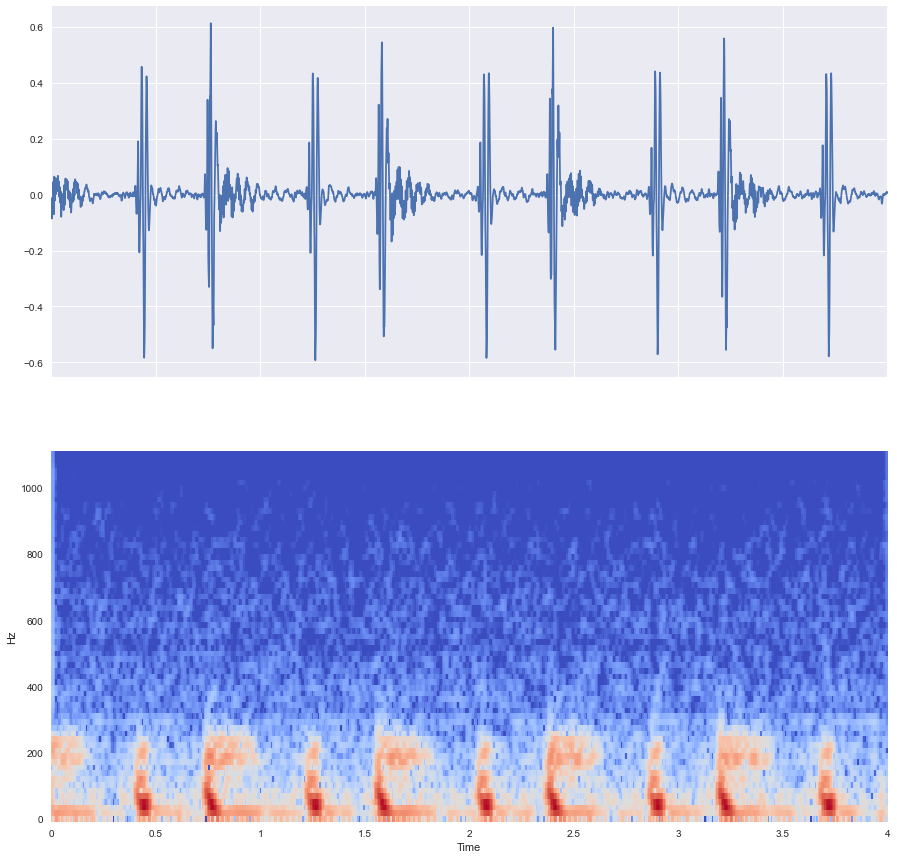

'  Do you notice that the heartbeats come in pairs, as seen by the vertical lines in the spectrogram?  '

In [12]:

from librosa.core import amplitude_to_db
from librosa.display import specshow
 
# Convert into decibels
spec_db = amplitude_to_db(spec)
 
# Compare the raw audio to the spectrogram of the audio
fig, axs = plt.subplots(2, 1, figsize=(15, 15), sharex=True)
axs[0].plot(time, audio)
specshow(spec_db, sr=sfreq, x_axis='time', y_axis='hz', hop_length=HOP_LENGTH)
plt.show()

"""  Do you notice that the heartbeats come in pairs, as seen by the vertical lines in the spectrogram?  """

> **Engineering spectral features**

As you can probably tell, there is a lot more information in a spectrogram compared to a raw audio file. By computing the spectral features, you have a much better idea of what's going on. As such, there are all kinds of spectral features that you can compute using the spectrogram as a base. In this exercise, you'll look at a few of these features.

The spectogram `spec` from the previous exercise is available in your workspace.

Instructions: <br>

- Calculate the **spectral bandwidth** as well as the **spectral centroid** of the spectrogram by using functions in `librosa.feature`.

In [13]:
spec = np.absolute(spec.astype(np.float32))
spec

array([[5.78795969e-01, 1.97362378e-01, 5.40734529e-01, ...,
        2.82254845e-01, 5.06783836e-02, 8.50139186e-02],
       [7.55336702e-01, 6.12887740e-01, 3.08458120e-01, ...,
        1.19367287e-01, 1.24381974e-01, 1.37131587e-01],
       [6.17729366e-01, 7.27054954e-01, 1.83063820e-01, ...,
        8.54593888e-02, 1.74702987e-01, 8.89286324e-02],
       ...,
       [8.04264192e-03, 1.02397334e-03, 4.65709018e-03, ...,
        1.28283282e-03, 8.83886416e-04, 3.15429247e-03],
       [7.29469396e-03, 4.77909762e-03, 4.01456200e-05, ...,
        2.34828141e-04, 1.56173646e-03, 3.32333287e-03],
       [7.02228677e-03, 6.13564858e-03, 3.66828614e-03, ...,
        1.41663000e-03, 2.68867845e-03, 3.39234457e-03]], dtype=float32)

In [14]:
import librosa as lr
 
# Calculate the spectral centroid and bandwidth for the spectrogram
bandwidths = lr.feature.spectral_bandwidth(S=spec)[0]
centroids = lr.feature.spectral_centroid(S=spec)[0]

In [97]:
times_spec = time[::HOP_LENGTH]

(8820,)

In [55]:
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

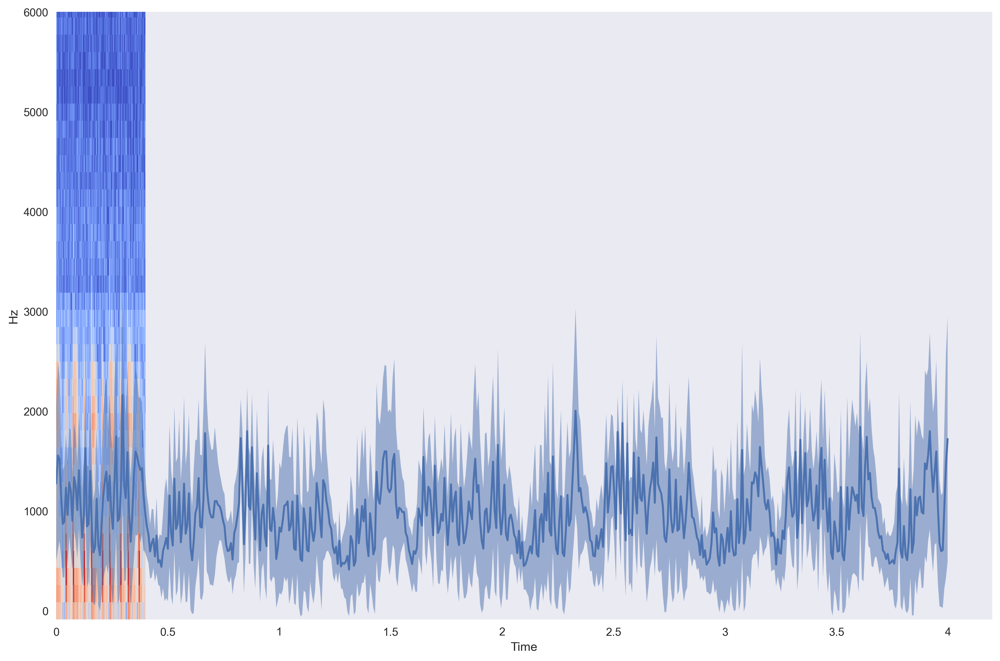

'As you can see, the spectral centroid and bandwidth characterize the spectral content in each sound over time. They give us a summary of the spectral content that we can use in a classifier.'

In [64]:
from librosa.core import amplitude_to_db
from librosa.display import specshow

# Convert spectrogram to decibels for visualization
spec_db = amplitude_to_db(spec)

# Display these features on top of the spectrogram
fig, ax = plt.subplots(figsize=(15, 10))

specshow(spec_db, ax = ax, x_axis='time', y_axis='hz', hop_length=HOP_LENGTH)
ax.plot(times_spec, centroids)
ax.fill_between(times_spec, centroids - bandwidths / 2, centroids + bandwidths / 2, alpha=.5)
ax.set(ylim=[None, 6000])
plt.show()

"""As you can see, the spectral centroid and bandwidth characterize the spectral content in each sound over time. They give us a summary of the spectral content that we can use in a classifier."""


> **Combining many features in a classifier**

You've spent this lesson engineering many features from the audio data - some contain information about how the audio changes in time, others contain information about the spectral content that is present.

The beauty of machine learning is that it can handle all of these features at the same time. If there is different information present in each feature, it should improve the classifier's ability to distinguish the types of audio. Note that this often requires more advanced techniques such as regularization, which we'll cover in the next chapter.

For the final exercise in the chapter, we've loaded many of the features that you calculated before. Combine all of them into an array that can be fed into the classifier, and see how it does.

Instructions: <br>

- Loop through each spectrogram, calculating the mean spectral bandwidth and centroid of each.

In [7]:
# Import the stft function
from librosa.core import stft
import librosa as lr
 
# Prepare the STFT
HOP_LENGTH = 2**4
SIZE_WINDOW = 2**7

path = './datasets/audio_munged.hdf5'
key_data = pd.read_hdf(path, key='h5io/key_data')
cols_list = [col_values.to_numpy() for _, col_values in key_data.iteritems()]


def mySTFT(col_data, H_L =HOP_LENGTH, S_Z = SIZE_WINDOW):
    col_spec = stft(col_data, hop_length= H_L, n_fft= S_Z)
    return np.abs(col_spec.astype(np.float32))

# mySTFT(cols_list[0])

spectrograms = [ mySTFT(col) for col in cols_list]
spectrograms[0].shape

(65, 552)

In [8]:
# Loop through each spectrogram
bandwidths = []
centroids = []
 
for spec in spectrograms:
    # Calculate the mean spectral bandwidth
    this_mean_bandwidth = np.mean(lr.feature.spectral_bandwidth(S=spec))
    # Calculate the mean spectral centroid
    this_mean_centroid = np.mean(lr.feature.spectral_centroid(S=spec))
    # Collect the values
    bandwidths.append(this_mean_bandwidth)  
    centroids.append(this_mean_centroid)

In [13]:
# Prepare for the next exercise
path = './datasets/audio_munged.hdf5'
df = pd.read_hdf(path, key='h5io/key_data')
audio = df.squeeze()

key_meta = pd.read_hdf(path, key='h5io/key_meta')
labels = key_meta["label"].to_numpy() 

# Smooth by applying a rolling mean
audio_rectified = audio.apply(np.abs)
audio_rectified_smooth = audio_rectified.rolling(50).mean()

# Calculate stats
means = np.mean(audio_rectified_smooth, axis=0)
stds = np.std(audio_rectified_smooth, axis=0)
maxs = np.max(audio_rectified_smooth, axis=0)

# Calculate the tempo of the sounds
tempos = []
for col, i_audio in audio.items():
    tempos.append(lr.beat.tempo(i_audio.values, sr=sfreq, hop_length=2**6, aggregate=None))
 
# Convert the list to an array so you can manipulate it more easily
tempos = np.array(tempos)
 
# Calculate statistics of each tempo
tempos_mean = tempos.mean(axis=-1)
tempos_std = tempos.std(axis=-1)
tempos_max = tempos.max(axis=-1)


from sklearn.svm import LinearSVC
from sklearn.model_selection import cross_val_score
model = LinearSVC()

- Column stack all the features to create the array X.
- Score the classifier with cross-validation.

In [14]:
# Create X and y arrays
X = np.column_stack([means, stds, maxs, tempos_mean, tempos_max, tempos_std, bandwidths, centroids])
y = labels.reshape([-1, 1])
 
# Fit the model and score on testing data
percent_score = cross_val_score(model, X, y, cv=5)
print(np.mean(percent_score))

0.6333333333333334


Oh, the result does not looks like the DataCamp's output. I checked, and it looks like the labels that they provide does not match with what was using. Here is the label raw data.

In [20]:
labels = np.array(['normal', 'normal', 'normal', 'murmur', 'normal', 'normal',
       'normal', 'murmur', 'normal', 'murmur', 'normal', 'normal',
       'normal', 'murmur', 'murmur', 'normal', 'normal', 'murmur',
       'murmur', 'normal', 'murmur', 'murmur', 'murmur', 'murmur',
       'normal', 'normal', 'murmur', 'normal', 'normal', 'murmur',
       'murmur', 'murmur', 'murmur', 'murmur', 'murmur', 'normal',
       'normal', 'murmur', 'murmur', 'murmur', 'normal', 'murmur',
       'murmur', 'normal', 'normal', 'normal', 'murmur', 'murmur',
       'murmur', 'normal', 'normal', 'normal', 'normal', 'murmur',
       'normal', 'normal', 'murmur', 'murmur', 'murmur', 'murmur'],
      dtype=object)

Now we fit the model and score it again.

In [22]:
model3 = LinearSVC()

# Create X and y arrays
X = np.column_stack([means, stds, maxs, tempos_mean, tempos_max, tempos_std, bandwidths, centroids])
y = labels.reshape([-1, 1])
 
# Fit the model and score on testing data
percent_score = cross_val_score(model3, X, y, cv=5)
print(np.mean(percent_score))

""" There we go, this was the shown result. Note that if we rerun the cell, the score's result will change. """

0.4833333333333333


' There we go, this was the shown result '

You calculated many different features of the audio, and combined each of them under the assumption that they provide independent information that can be used in classification. You may have noticed that the accuracy of your models varied a lot when using different set of features. This chapter was focused on creating new "features" from raw data and not obtaining the best accuracy. To improve the accuracy, you want to find the right features that provide relevant information and also build models on much larger data.

## Predicting Time Series Data

> If you want to predict patterns from data over time, there are special considerations to take in how you choose and construct your model. This chapter covers how to gain insights into the data before fitting your model, as well as best-practices in using predictive modeling for time series data.

### Predicting data over time


> **Introducing the dataset**

As mentioned in the video, you'll deal with stock market prices that fluctuate over time. In this exercise you've got historical prices from two tech companies (Ebay and Yahoo) in the DataFrame prices. You'll visualize the raw data for the two companies, then generate a scatter plot showing how the values for each company compare with one another. Finally, you'll add in a "time" dimension to your scatter plot so you can see how this relationship changes over time.

The data has been loaded into a DataFrame called prices.

Instructions: <br>

- Plot the data in prices. Pay attention to any irregularities you notice.
- Generate a scatter plot with the values of Ebay on the x-axis, and Yahoo on the y-axis. Look up the symbols for both companies from the column names of the DataFrame.
- Finally, encode time as the color of each datapoint in order to visualize how the relationship between these two variables changes.

In [81]:
prices = pd.read_csv('./datasets/prices_ebay_yahoo.csv', index_col=0, parse_dates=True)
prices.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1278 entries, 2010-01-04 to 2015-01-30
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   EBAY    1278 non-null   float64
 1   YHOO    1278 non-null   float64
dtypes: float64(2)
memory usage: 30.0 KB


In [29]:
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import matplotlib as mpl 
mpl.rcParams['figure.dpi'] = 150
mpl.rcParams['figure.figsize'] = (15, 12)

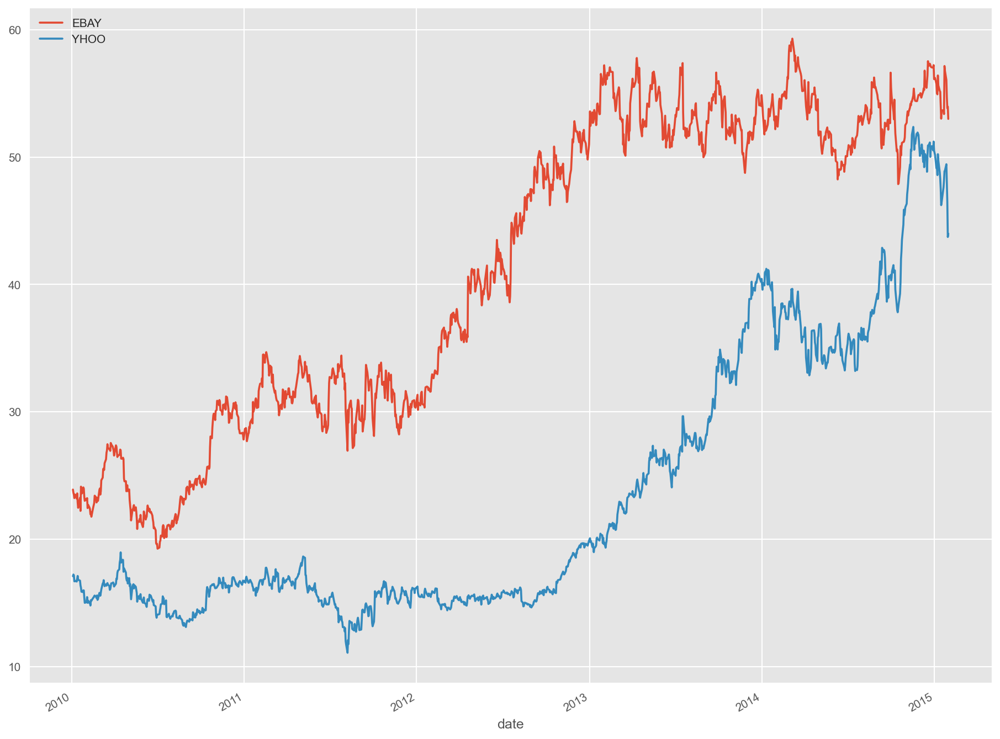

In [30]:
# Plot the raw values over time
prices.plot()
# add legend and set position to upper left
plt.legend( loc='upper left')
plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


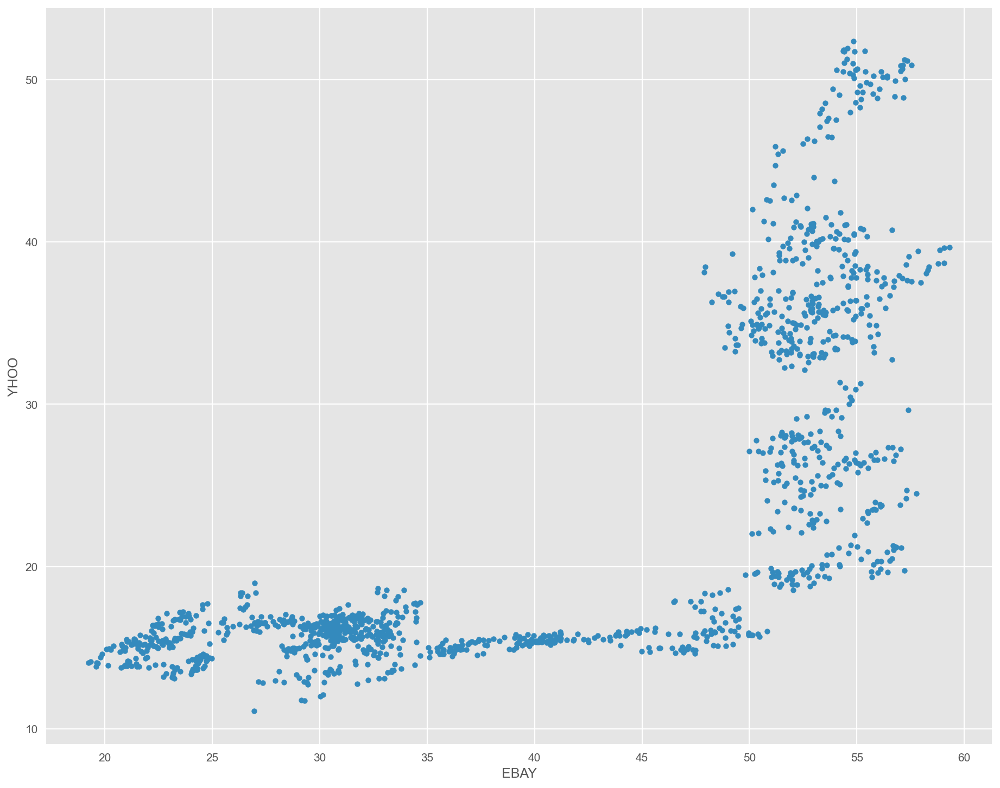

In [31]:
# Scatterplot with one company per axis
prices.plot.scatter('EBAY', 'YHOO')
plt.legend( loc='upper left')
plt.show()

[Text(1, 1.26e+18, 'Dec 2009'),
 Text(1, 1.28e+18, 'Jul 2010'),
 Text(1, 1.3e+18, 'Mar 2011'),
 Text(1, 1.32e+18, 'Oct 2011'),
 Text(1, 1.34e+18, 'Jun 2012'),
 Text(1, 1.36e+18, 'Feb 2013'),
 Text(1, 1.38e+18, 'Sep 2013'),
 Text(1, 1.4e+18, 'May 2014'),
 Text(1, 1.42e+18, 'Dec 2014'),
 Text(1, 1.44e+18, 'Aug 2015')]

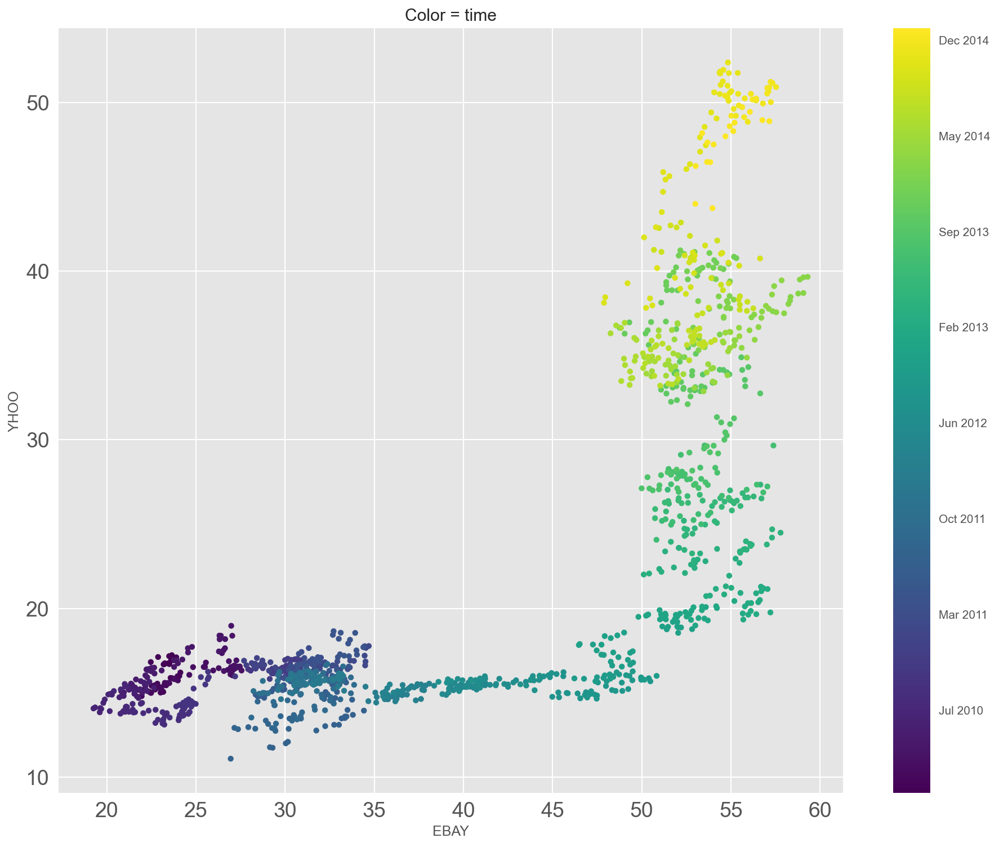

In [95]:
# Scatterplot with color relating to time
prices.plot.scatter('EBAY', 'YHOO', c=prices.index, cmap=plt.cm.viridis, colorbar=False, sharex=False, fontsize=18, title='Color = time')

# Define your mappable for colorbar creation
sm = plt.cm.ScalarMappable(cmap='viridis', 
                           norm=plt.Normalize(vmin=prices.index.min().value,
                                              vmax=prices.index.max().value))
cbar = plt.colorbar(sm)
# Change the numeric ticks into ones that match the x-axis
cbar.ax.set_yticklabels(pd.to_datetime(cbar.get_ticks()).strftime(date_format='%b %Y'))

Let's try with a different view. 

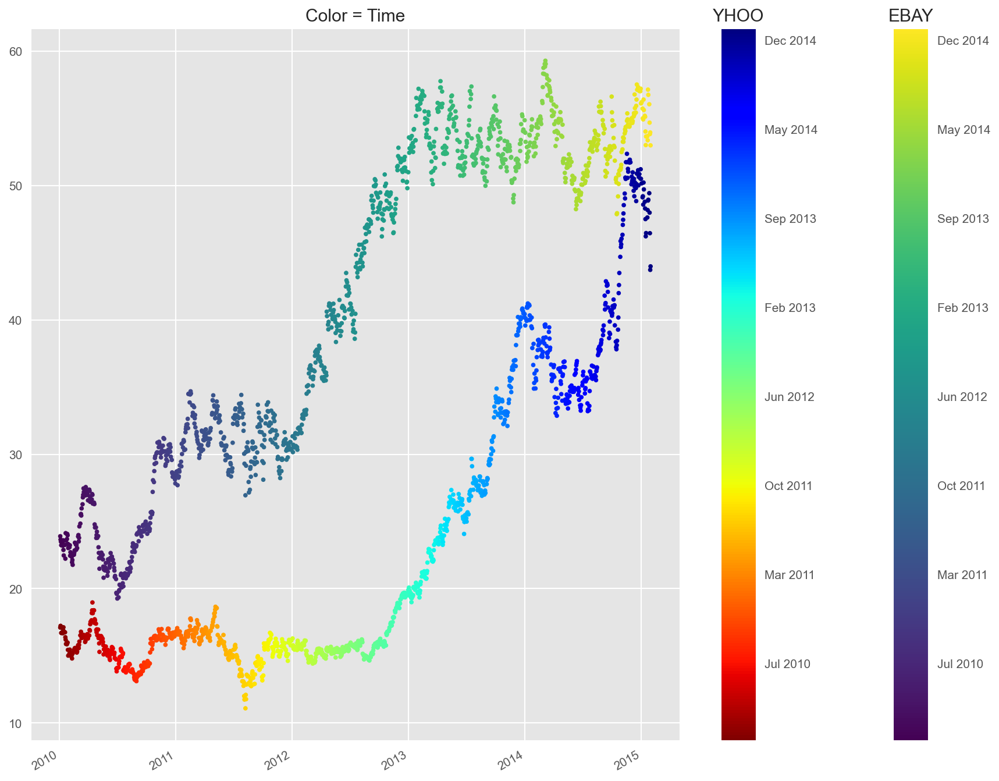

'As you can see, these two time series seem somewhat related to each other, though its a complex relationship that changes over time.'

In [96]:
df = prices

fig,ax=plt.subplots()
sca  = ax.scatter(df.index,df['EBAY'],c=df.index,cmap='viridis', s=10)
sca2 = ax.scatter(df.index,df['YHOO'],c=df.index,cmap='jet_r', s=10)


cbar = plt.colorbar(sca)
cbar.ax.set_title("EBAY")
cbar.ax.set_yticklabels(pd.to_datetime(cbar.get_ticks()).strftime(date_format='%b %Y'))

cbar2 = plt.colorbar(sca2)
cbar2.ax.set_title("YHOO")
cbar2.ax.set_yticklabels(pd.to_datetime(cbar.get_ticks()).strftime(date_format='%b %Y'))

fig.autofmt_xdate()
ax.set_title("Color = Time")
plt.show()

"""As you can see, these two time series seem somewhat related to each other, though its a complex relationship that changes over time."""

> **Fitting a simple regression model**

Now we'll look at a larger number of companies. Recall that we have historical price values for many companies. Let's use data from several companies to predict the value of a test company. You'll attempt to predict the value of the **Apple** stock price using the values of NVidia, Ebay, and Yahoo. Each of these is stored as a column in the `all_prices` DataFrame. Below is a mapping from company name to column name:

```
ebay: "EBAY"
nvidia: "NVDA"
yahoo: "YHOO"
apple: "AAPL"
``` 
We'll use these columns to define the input/output arrays in our model.

Instructions: <br>

- Create the X and y arrays by using the column names provided.
- The input values should be from the companies "ebay", "nvidia", and "yahoo"
- The output values should be from the company "apple"
- Use the data to train and score the model with cross-validation.

In [118]:
import re, csv, os

file_path = './datasets/all_prices.txt'

with open(file_path, "r") as f:
    plain_str = f.read()
    print(plain_str[:10], plain_str[-10:])
    csv_data = re.match(r".*?b\'(.*)\'.*?", plain_str).group(1) # remove byte traces
    print("START:\n",csv_data[:250],"\nEND:", csv_data[-250:])

    csv_data = csv_data.replace('\\n', '\n') # remove \\n with actual new line chars
    print("START:\n",csv_data[:250],"\nEND:", csv_data[-250:])

    with open(os.path.splitext(file_path)[0] + '.csv', 'w') as out:
        out.write(csv_data)

b'date,AAP 0002\n' 


START:
 date,AAPL,ABT,AIG,AMAT,ARNC,BAC,BSX,C,CHK,CMCSA,CSCO,DAL,EBAY,F,FB,FCX,FITB,FOXA,FTR,GE,GILD,GLW,GM,HAL,HBAN,HPE,HPQ,INTC,JPM,KEY,KMI,KO,MRK,MRO,MSFT,MU,NFLX,NVDA,ORCL,PFE,QCOM,RF,SBUX,T,V,VZ,WFC,XOM,XRX,YHOO\n2010-01-04,214.009998,54.459951,29.88999 
END: ,10.02,,36.129996000000006,33.040001000000004,54.380001,12.99,41.049999,41.169998,60.279999,26.6,40.400002,29.27,441.799992,19.200001,41.889999,31.25,62.459999,8.7,87.529999,32.919998,254.910004,45.709999,51.919998,87.41999799999999,13.17,43.990002\n
START:
 date,AAPL,ABT,AIG,AMAT,ARNC,BAC,BSX,C,CHK,CMCSA,CSCO,DAL,EBAY,F,FB,FCX,FITB,FOXA,FTR,GE,GILD,GLW,GM,HAL,HBAN,HPE,HPQ,INTC,JPM,KEY,KMI,KO,MRK,MRO,MSFT,MU,NFLX,NVDA,ORCL,PFE,QCOM,RF,SBUX,T,V,VZ,WFC,XOM,XRX,YHOO
2010-01-04,214.009998,54.459951,29.889999 
END: 2,10.02,,36.129996000000006,33.040001000000004,54.380001,12.99,41.049999,41.169998,60.279999,26.6,40.400002,29.27,441.799992,19.200001,41.889999,31.25,62.459999,8.7,87.529999,32.919998,254.910004,4

In [124]:
all_prices = pd.read_csv('./datasets/all_prices.csv', index_col=0, parse_dates=True)
all_prices.head()

,AAPL,ABT,AIG,AMAT,ARNC,BAC,BSX,C,CHK,CMCSA,...,QCOM,RF,SBUX,T,V,VZ,WFC,XOM,XRX,YHOO
date,,,,,,,,,,,,,,,,,,,,,
2010-01-04,214.009998,54.459951,29.889999,14.30,16.650013,15.690000,9.01,3.40,28.090001,16.969999,...,46.939999,5.42,23.049999,28.580000,88.139999,33.279869,27.320000,69.150002,8.63,17.100000
2010-01-05,214.379993,54.019953,29.330000,14.19,16.130013,16.200001,9.04,3.53,28.970002,16.740000,...,48.070000,5.60,23.590000,28.440001,87.129997,33.339868,28.070000,69.419998,8.64,17.230000
2010-01-06,210.969995,54.319953,29.139999,14.16,16.970013,16.389999,9.16,3.64,28.650002,16.620001,...,47.599998,5.67,23.420000,27.610001,85.959999,31.919873,28.110001,70.019997,8.56,17.170000
2010-01-07,210.580000,54.769952,28.580000,14.01,16.610014,16.930000,9.09,3.65,28.720002,16.969999,...,48.980000,6.17,23.360001,27.299999,86.760002,31.729875,29.129999,69.800003,8.60,16.700001
2010-01-08,211.980005,55.049952,29.340000,14.55,17.020014,16.780001,9.00,3.59,28.910002,16.920000,...,49.470001,6.18,23.280001,27.100000,87.000000,31.749874,28.860001,69.519997,8.57,16.700001


In [123]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import cross_val_score

# Use stock symbols to extract training data
X = all_prices[['EBAY', 'NVDA', 'YHOO']]
y = all_prices[['AAPL']]

# Fit and score the model with cross-validation
scores = cross_val_score(Ridge(), X, y, cv=3)
print(scores)

""" As you can see, fitting a model with raw data doesn't give great results."""

[-6.09050633 -0.3179172  -3.72957284]


" As you can see, fitting a model with raw data doesn't give great results."

> **Visualizing predicted values**

When dealing with time series data, it's useful to visualize model predictions on top of the "actual" values that are used to test the model.

In this exercise, after splitting the data (stored in the variables X and y) into training and test sets, you'll build a model and then visualize the model's predictions on top of the testing data in order to estimate the model's performance.

Instructions: <br>

- Split the data (X and y) into training and test sets.
- Use the training data to train the regression model.
- Then use the testing data to generate predictions for the model.


In [126]:
X = pd.read_csv('./datasets/X.csv', index_col=[0]).to_numpy()
y = pd.read_csv('./datasets/y.csv', index_col=[0]).to_numpy()
display(X.shape)
display(y.shape)

(775, 3)

(775, 1)

In [127]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

# Split our data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                   train_size=.8, shuffle=False, random_state=1)

# Fit our model and generate predictions
model = Ridge()
model.fit(X_train, y_train)
predictions = model.predict(X_test)
score = r2_score(y_test, predictions)
print(score)

-5.709399019485136


- Plot a time series of the predicted and "actual" values of the testing data.

In [150]:
mpl.rcParams['figure.figsize'] = (30, 20)
mpl.rcParams["xtick.labelsize"], mpl.rcParams["ytick.labelsize"] = 25,25

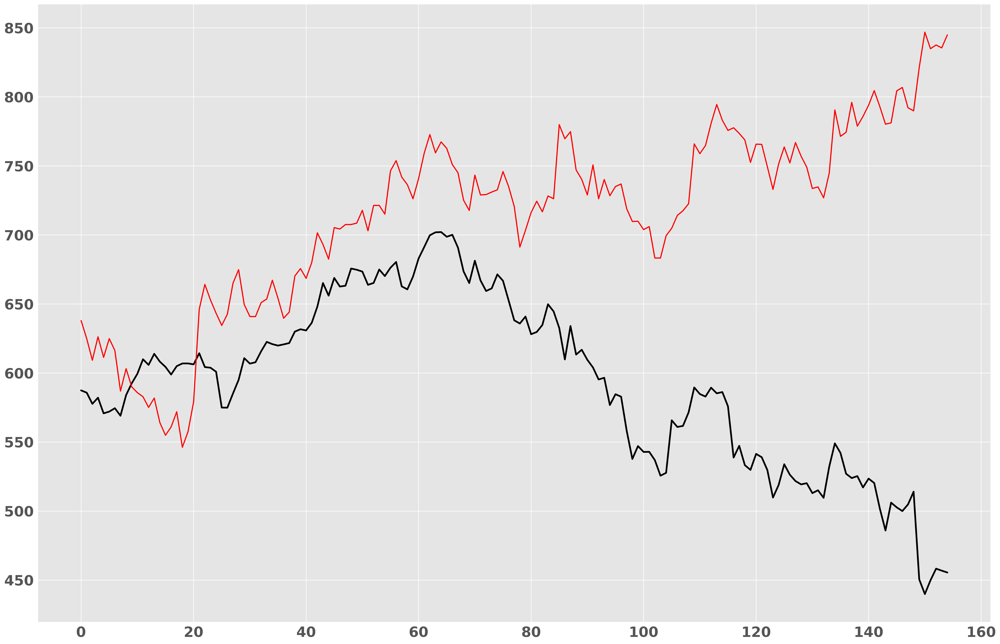

In [151]:
# Visualize our predictions along with the "true" values, and print the score
fig, ax = plt.subplots()
ax.plot(y_test, color='k', lw=3)
ax.plot(predictions, color='r', lw=2)
plt.show()

### Advanced time series prediction


> **Visualizing messy data**

Let's take a look at a new dataset - this one is a bit less-clean than what you've seen before.

As always, you'll first start by visualizing the raw data. Take a close look and try to find datapoints that could be problematic for fitting models.

The data has been loaded into a DataFrame called `prices`.

Instructions: <br>

- Visualize the time series data using Pandas.
- Calculate the number of missing values in each time series. Note any irregularities that you can see. What do you think they are?

In [152]:
prices = pd.read_csv('./datasets/prices_ebay_yahoo_nvidia.csv', parse_dates=True, index_col=0)
prices

,EBAY,NVDA,YHOO
date,,,
2010-01-04,23.900000,18.490000,17.100000
2010-01-05,23.650000,18.760000,17.230000
2010-01-06,23.500000,18.879999,17.170000
2010-01-07,23.229998,18.510000,16.700001
2010-01-08,23.509999,18.549999,16.700001
...,...,...,...
2016-12-23,29.790001,109.779999,38.660000
2016-12-27,30.240000,117.320000,38.919998
2016-12-28,30.010000,109.250000,38.730000


In [157]:
# Visualize the dataset
prices.plot(legend=True)
plt.tight_layout()
plt.show()

# Count the missing values of each time series
missing_values = prices.isna().sum()
print(missing_values)


""" In the plot, you can see there are clearly missing chunks of time in your data. There also seem to be a few 'jumps' in the data. How can you deal with this?"""


EBAY    273
NVDA    502
YHOO    232
dtype: int64


" In the plot, you can see there are clearly missing chunks of time in your data. There also seem to be a few 'jumps' in the data. How can you deal with this?"

> **Imputing missing values**

When you have missing data points, how can you fill them in?

In this exercise, you'll practice using different interpolation methods to fill in some missing values, visualizing the result each time. But first, you will create the function (`interpolate_and_plot()`) you'll use to interpolate missing data points and plot them.

A single time series has been loaded into a DataFrame called `prices`.


Instructions: <br>

- Create a boolean mask for missing values and interpolate the missing values using the `interpolation` argument of the function.
- Interpolate using the latest non-missing value and plot the results. Recall that `interpolate_and_plot`'s second input is a string specifying the kind of interpolation to use.
- Interpolate linearly and plot the results.
- Interpolate with a quadratic function and plot the results.

In [158]:
# Create a function we'll use to interpolate and plot
def interpolate_and_plot(prices, interpolation):

    # Create a boolean mask for missing values
    missing_values = prices.isna()

    # Interpolate the missing values
    prices_interp = prices.interpolate(interpolation)

    # Plot the results, highlighting the interpolated values in black
    fig, ax = plt.subplots(figsize=(10, 5))
    prices_interp.plot(color='k', alpha=.6, ax=ax, legend=False)
    
    # Now plot the interpolated values on top in red
    prices_interp[missing_values].plot(ax=ax, color='r', lw=3, legend=False)
    plt.show()

In [161]:
plt.style.use('seaborn')
mpl.rcParams['figure.figsize'] = (30, 20)
mpl.rcParams["xtick.labelsize"], mpl.rcParams["ytick.labelsize"] = 12,12

In [166]:
prices = prices.head(1278)
prices

,EBAY,NVDA,YHOO
date,,,
2010-01-04,23.900000,18.490000,17.100000
2010-01-05,23.650000,18.760000,17.230000
2010-01-06,23.500000,18.879999,17.170000
2010-01-07,23.229998,18.510000,16.700001
2010-01-08,23.509999,18.549999,16.700001
...,...,...,...
2015-01-26,56.059999,20.620001,49.439999
2015-01-27,54.690000,19.629999,47.990002
2015-01-28,53.839999,19.309999,46.459999


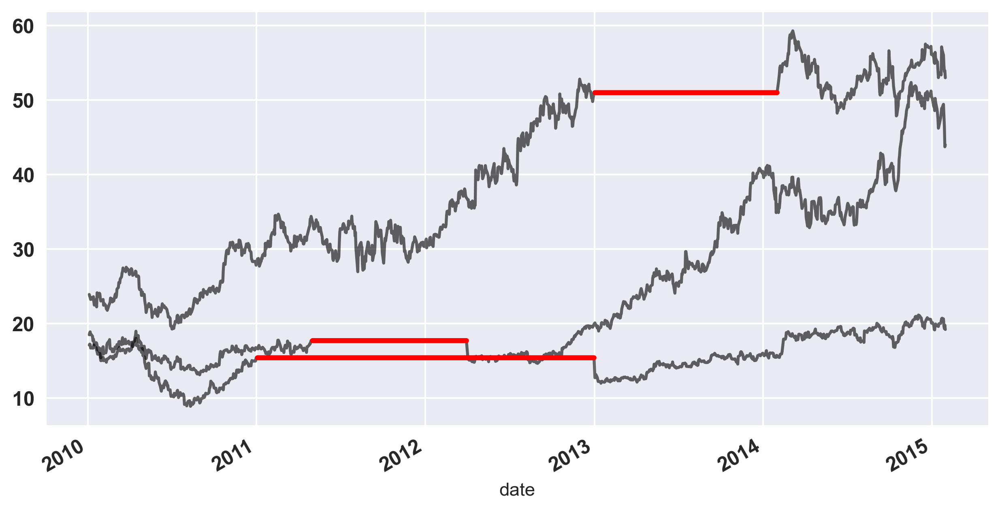

In [165]:
# Interpolate using the latest non-missing value
interpolation_type = 'zero'
interpolate_and_plot(prices, interpolation_type)

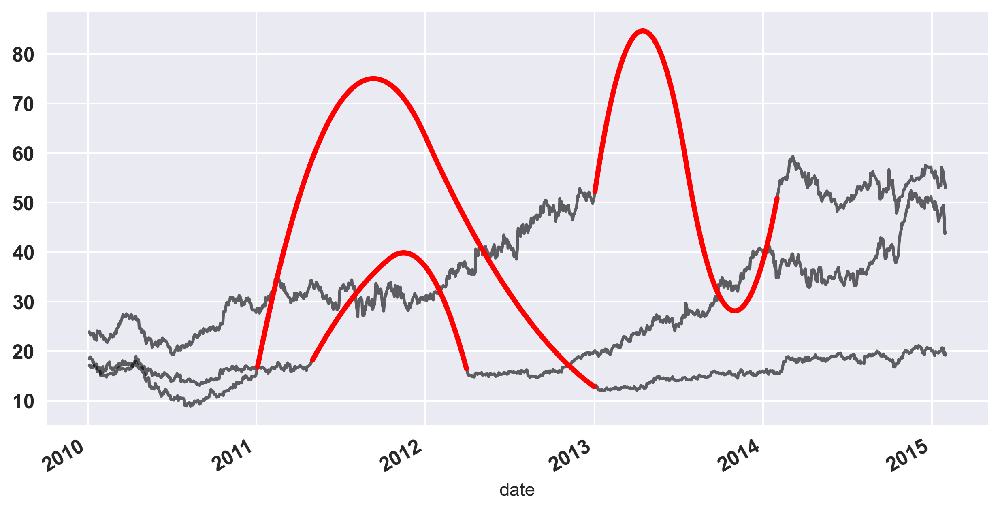

' Correct! When you interpolate, the pre-existing data is used to infer the values of missing data. As you can see, the method you use for this has a big effect on the outcome.'

In [168]:
# Interpolate with a quadratic function
interpolation_type = 'quadratic'
interpolate_and_plot(prices, interpolation_type)

""" Correct! When you interpolate, the pre-existing data is used to infer the values of missing data. As you can see, the method you use for this has a big effect on the outcome."""

> **Transforming raw data**

In the last chapter, you calculated the rolling mean. In this exercise, you will define a function that calculates the percent change of the latest data point from the mean of a window of previous data points. This function will help you calculate the percent change over a rolling window.

This is a more stable kind of time series that is often useful in machine learning.

Instructions: <br>

- Define a percent_change function that takes an input time series and does the following:
- Extract all but the last value of the input series (assigned to previous_values) and the only the last value of the timeseries ( assigned to last_value)
- Calculate the percentage difference between the last value and the mean of earlier values.
- Using a rolling window of 20, apply this function to prices, and visualize it using the given code.

In [171]:
prices = all_prices[["EBAY"  , "NVDA"  , "YHOO" ,   "AAPL"]]
prices

,EBAY,NVDA,YHOO,AAPL
date,,,,
2010-01-04,23.900000,18.490000,17.100000,214.009998
2010-01-05,23.650000,18.760000,17.230000,214.379993
2010-01-06,23.500000,18.879999,17.170000,210.969995
2010-01-07,23.229998,18.510000,16.700001,210.580000
2010-01-08,23.509999,18.549999,16.700001,211.980005
...,...,...,...,...
2015-01-26,56.059999,20.620001,49.439999,113.099998
2015-01-27,54.690000,19.629999,47.990002,109.139999
2015-01-28,53.839999,19.309999,46.459999,115.309998


In [180]:
mpl.rcParams['figure.figsize'] = (30, 30)
mpl.rcParams["xtick.labelsize"], mpl.rcParams["ytick.labelsize"] = 25,25

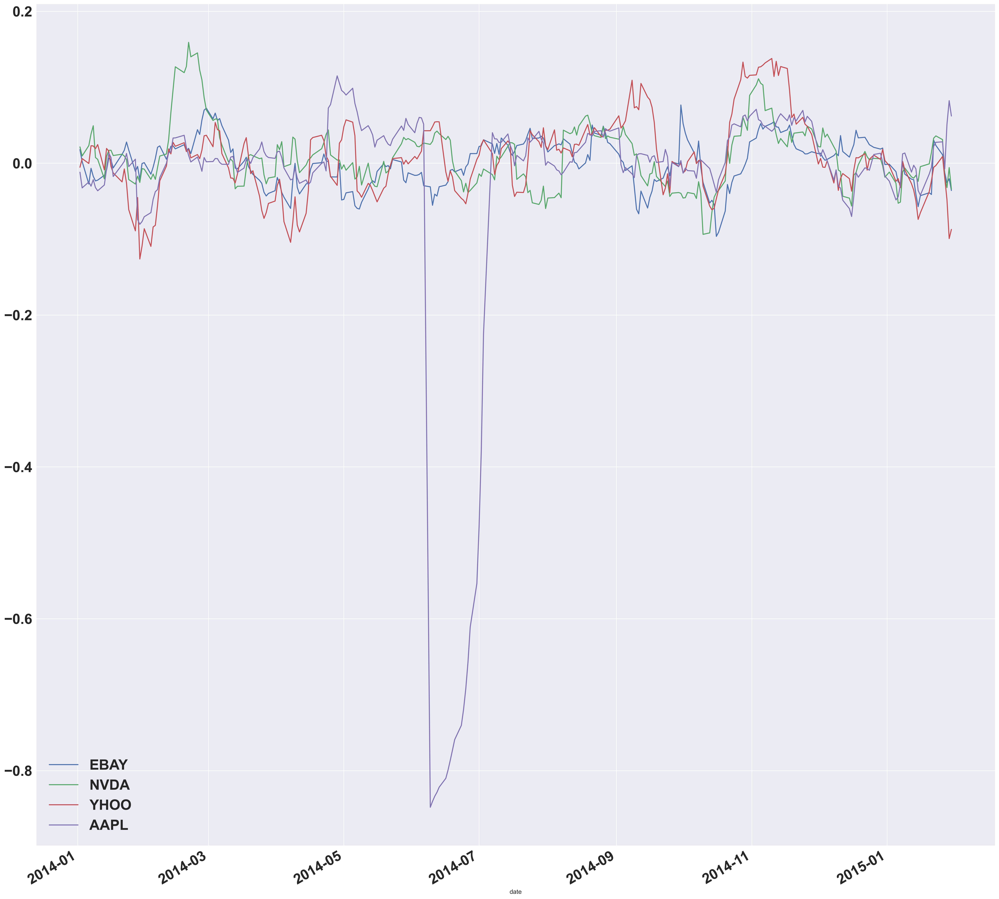

"You've converted the data so it's easier to compare one time point to another. This is a cleaner representation of the data. "

In [183]:
# Your custom function
def percent_change(series):
    # Collect all *but* the last value of this window, then the final value
   previous_values = series[:-1]
   last_value = series[-1]

    # Calculate the % difference between the last value and the mean of earlier values
   percent_change = (last_value - np.mean(previous_values)) / np.mean(previous_values)
   return percent_change

# Apply your custom function and plot
prices_perc = prices.rolling(20).apply(percent_change)
prices_perc.loc["2014":"2015"].plot()
plt.legend(loc="lower left", prop={'size': 25})
plt.show()

"""You've converted the data so it's easier to compare one time point to another. This is a cleaner representation of the data. """

> **Handling outliers**

In this exercise, you'll handle outliers - data points that are so different from the rest of your data, that you treat them differently from other "normal-looking" data points. You'll use the output from the previous exercise (percent change over time) to detect the outliers. First you will write a function that replaces outlier data points with the median value from the entire time series.

Instructions:<br>

- Define a function that takes an input series and does the following:
- Calculates the absolute value of each datapoint's distance from the series mean, then creates a boolean mask for datapoints that are three times the standard deviation from the mean.
- Use this boolean mask to replace the outliers with the median of the entire series.
- Apply this function to your data and visualize the results using the given code.


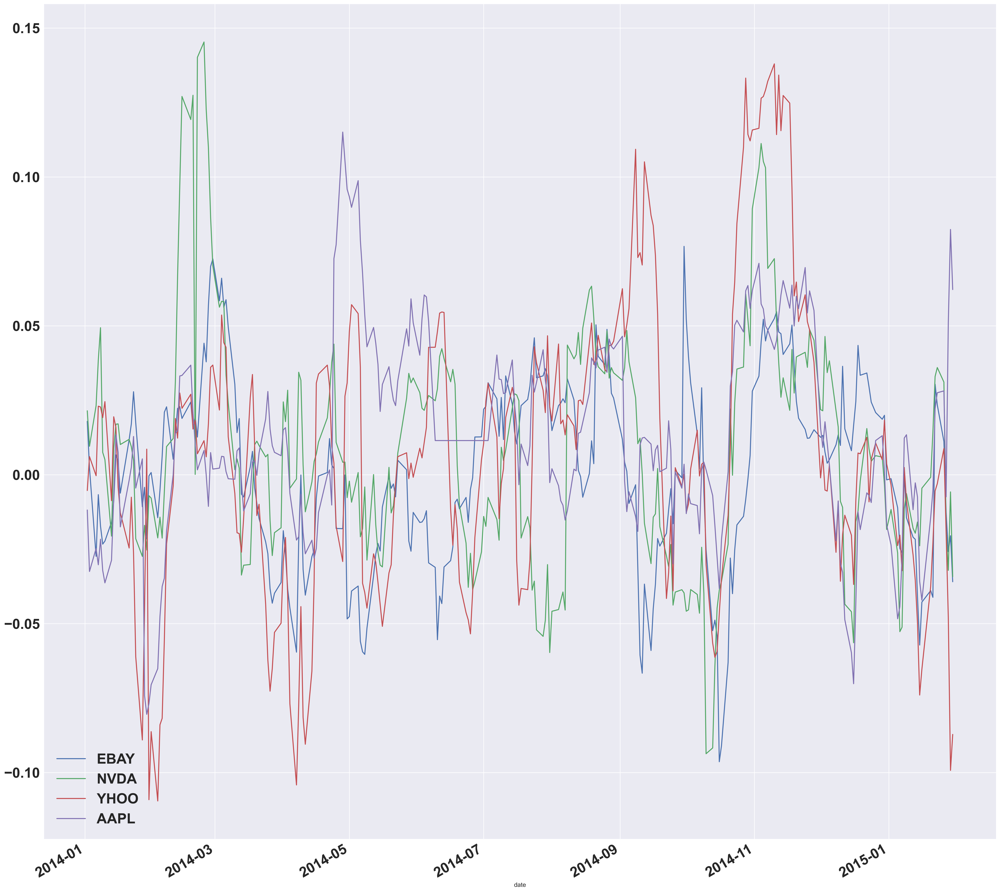

"Since you've converted the data to % change over time, it was easier to spot and correct the outliers."

In [187]:
def replace_outliers(series):
    # Calculate the absolute difference of each timepoint from the series mean
    absolute_differences_from_mean = np.abs(series - np.mean(series))
    
    # Calculate a mask for the differences that are > 3 standard deviations from zero
    this_mask = absolute_differences_from_mean > (np.std(series) * 3)

    # Replace these values with the median accross the data
    series[this_mask] = np.nanmedian(series)
    return series

# Apply your preprocessing function to the timeseries and plot the results
prices_perc = prices_perc.apply(replace_outliers)
prices_perc.loc["2014":"2015"].plot()
plt.legend(loc="lower left", prop={'size': 25})
plt.show()

"""Since you've converted the data to % change over time, it was easier to spot and correct the outliers."""

In [185]:
prices_perc

,EBAY,NVDA,YHOO,AAPL
date,,,,
2010-01-04,NaN,NaN,NaN,NaN
2010-01-05,NaN,NaN,NaN,NaN
2010-01-06,NaN,NaN,NaN,NaN
2010-01-07,NaN,NaN,NaN,NaN
2010-01-08,NaN,NaN,NaN,NaN
...,...,...,...,...
2015-01-26,0.011183,0.031136,0.008839,0.028172
2015-01-27,-0.012609,-0.018448,-0.019253,-0.007405
2015-01-28,-0.025789,-0.032080,-0.047920,0.051109


### Creating features over time


> **Engineering multiple rolling features at once**

Now that you've practiced some simple feature engineering, let's move on to something more complex. You'll calculate a collection of features for your time series data and visualize what they look like over time. This process resembles how many other time series models operate.

Instructions:<br>

- Define a list consisting of four features you will calculate: the minimum, maximum, mean, and standard deviation (in that order).
- Using the rolling window (prices_perc_rolling) we defined for you, calculate the features from features_to_calculate.
- Plot the results over time, along with the original time series using the given code.


In [197]:
prices = pd.read_csv('./datasets/prices_ebay_yahoo_nvidia.csv', index_col=0, parse_dates=True)
ebay_prices = prices[["EBAY" ]]
prices_perc = ebay_prices.rolling(20).apply(percent_change)
prices_perc

,EBAY
date,
2010-01-04,NaN
2010-01-05,NaN
2010-01-06,NaN
2010-01-07,NaN
2010-01-08,NaN
...,...
2016-12-23,0.024842
2016-12-27,0.038030
2016-12-28,0.026925


In [198]:
# Define a rolling window with Pandas, excluding the right-most datapoint of the window
prices_perc_rolling = prices_perc.rolling(20, min_periods=5, closed='right')

# Define the features you'll calculate for each window
features_to_calculate = [np.min, np.max, np.mean, np.std]

# Calculate these features for your rolling window object
features = prices_perc_rolling.aggregate(features_to_calculate)

# Plot the results
ax = features.loc[:"2011-01"].plot()
prices_perc.loc[:"2011-01"].plot(ax=ax, color='k', alpha=.2, lw=3)
ax.legend(loc=(1.01, .6),prop={'size': 25})
plt.show()

> **Percentiles and partial functions**

In this exercise, you'll practice how to pre-choose arguments of a function so that you can pre-configure how it runs. You'll use this to calculate several percentiles of your data using the same `percentile()` function in `numpy`.

Instructions:<br>

- Import `partial` from `functools`.
- Use the` partial()` function to create several feature generators that calculate percentiles of your data using a list comprehension.
- Using the rolling window (`prices_perc_rolling`) we defined for you, calculate the quantiles using `percentile_functions`.
- Visualize the results using the code given to you.


In [195]:
# Import partial from functools
from functools import partial
percentiles = [1, 10, 25, 50, 75, 90, 99]

# Use a list comprehension to create a partial function for each quantile
percentile_functions = [partial(np.percentile, q=percentile) for percentile in percentiles]

# Calculate each of these quantiles on the data using a rolling window
prices_perc_rolling = prices_perc.rolling(20, min_periods=5, closed='right')
features_percentiles = prices_perc_rolling.aggregate(percentile_functions)

# Plot a subset of the result
ax = features_percentiles.loc[:"2011-01"].plot(cmap=plt.cm.viridis)
ax.legend(percentiles, loc=(1.01, .5),prop={'size': 25})
plt.show()

> **Using "date" information**

It's easy to think of timestamps as pure numbers, but don't forget they generally correspond to things that happen in the real world. That means there's often extra information encoded in the data such as "is it a weekday?" or "is it a holiday?". This information is often useful in predicting timeseries data.

In this exercise, you'll extract these date/time based features. A single time series has been loaded in a variable called `prices`.

Instructions:<br>

- Calculate the day of the week, week number in a year, and month number in a year.
- Add each one as a column to the `prices_perc` DataFrame, under the names `day_of_week`, `week_of_year` and `month_of_year`, respectively.

In [207]:
ebay_prices = all_prices['EBAY']
prices_perc = ebay_prices.rolling(20).apply(percent_change)
prices_perc.loc['2014-01-02':'2016-1-31']

date
2014-01-02    0.017938
2014-01-03    0.002268
2014-01-06   -0.027365
2014-01-07   -0.006665
2014-01-08   -0.017206
                ...   
2015-01-26    0.011183
2015-01-27   -0.012609
2015-01-28   -0.025789
2015-01-29   -0.020465
2015-01-30   -0.035902
Name: EBAY, Length: 272, dtype: float64


## Validating and Inspecting Time Series Models

> Once you've got a model for predicting time series data, you need to decide if it's a good or a bad model. This chapter coves the basics of generating predictions with models in order to validate them against "test" data.

### Creating features from the past

> **Creating time-shifted features**

> **Special case: Auto-regressive models**

> **Visualize regression coefficients**

> **Auto-regression with a smoother time series**


### Cross-validating time series data



> **Cross-validation with shuffling**


> **Cross-validation without shuffling**


> **Time-based cross-validation**


### Stationarity and stability



> **Stationarity**


> **Bootstrapping a confidence interval**


> **Calculating variability in model coefficients**


> **Visualizing model score variability over time**


> **Accounting for non-stationarity**




### Wrap-up